In [1]:
%load_ext autoreload
%autoreload 2
%cd ../../..
from rich import print



/Volumes/CrucialX/project-equinox


In [2]:
case_dir = "data/cases/LGAV_LFPG/"
batch_sgd_results_dir_path = f"{case_dir}results_full/"

In [3]:
# Look for the latest checkpoint in the `batch_sgd_results_dir_path`
import re
from pathlib import Path

def get_latest_checkpoint(results_dir_path):
    directory = Path(results_dir_path)
    
    # Pattern to match 'checkpoint_iter_X.pt' and capture X
    pattern = re.compile(r"checkpoint_iter_(\d+)\.pt")
    
    checkpoints = []
    
    # Iterate through files in the directory
    for file in directory.glob("checkpoint_iter_*.pt"):
        match = pattern.search(file.name)
        if match:
            iteration = int(match.group(1))
            checkpoints.append((iteration, file.name))
            
    if not checkpoints:
        return None
    
    # Sort by the iteration number (the first element of the tuple) and get the last one
    latest_checkpoint = max(checkpoints, key=lambda x: x[0])
    
    return latest_checkpoint[1]


latest_checkpoint_filename = batch_sgd_results_dir_path + get_latest_checkpoint(batch_sgd_results_dir_path)
print(f"Latest checkpoint: {latest_checkpoint_filename}")

Latest checkpoint: data/cases/LGAV_LFPG/results_full/checkpoint_iter_500.pt

In [4]:
from equinox.posttrain import load_cost_model_parameters
from rich.console import Console
from rich.table import Table

def print_params_table(params_dict):
    console = Console()
    
    # Initialize the table
    table = Table(title="Common Parameters", show_header=True, header_style="bold magenta")
    
    table.add_column("Parameter", style="dim", width=12)
    table.add_column("Value", justify="right")

    # Add rows, formatting floats to 6 decimal places for clarity
    for key, value in params_dict.items():
        table.add_row(key, f"{value:.6f}")

    console.print(table)

params = load_cost_model_parameters(latest_checkpoint_filename)
print("[bold red]Parameters retrieved from learned cost model[/bold red]")
print_params_table(params["common"])
print(params["preference_matrix"].shape)  # (num_nodes, num_nodes)

Parameters retrieved from learned cost model

     Common Parameters      
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━┓
┃ Parameter    ┃     Value ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━┩
│ bias         │  0.057471 │
│ ac_dist      │ -0.001668 │
│ time         │  0.011607 │
└──────────────┴───────────┘

torch.Size([600, 600])

Loading route graph from /Volumes/CrucialX/project-equinox/data/cases/LGAV_LFPG/graphs/routes.gml

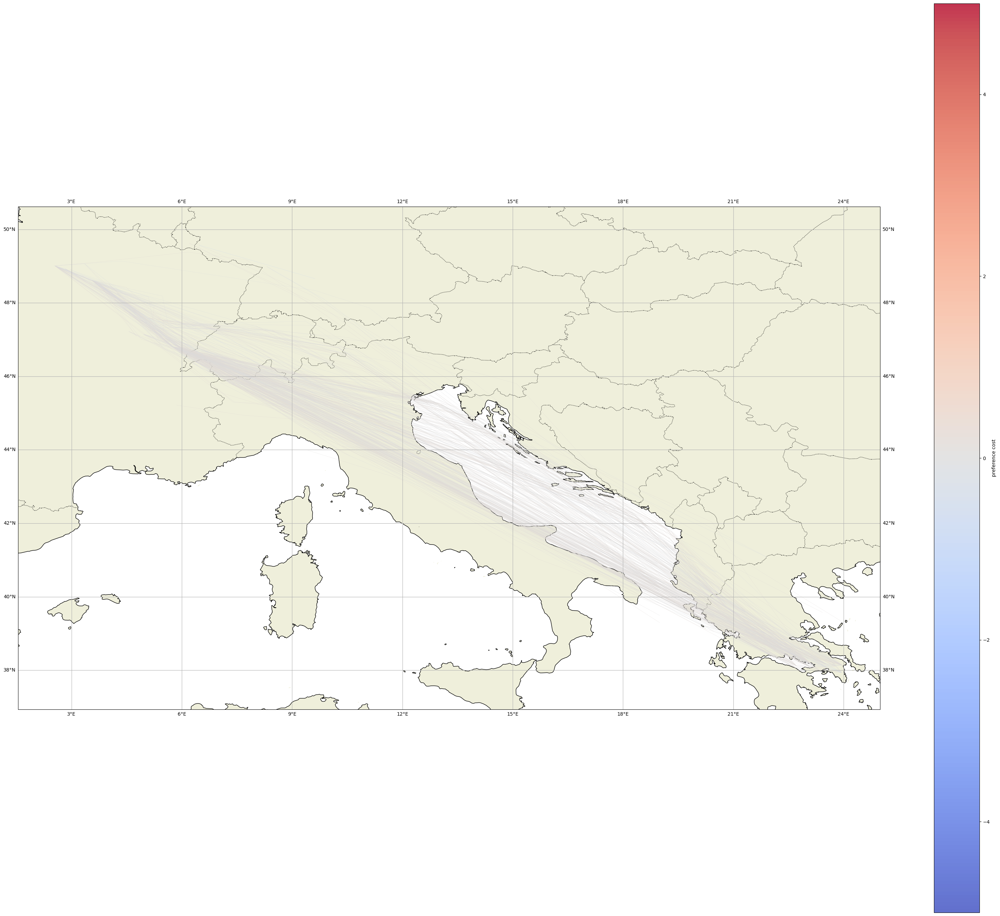

<GeoAxes: >

In [5]:
from equinox.posttrain import load_checkpoint_edge_preferences, plot_edge_preferences_cartopy

from pathlib import Path

def get_gml_path(batch_sgd_results_dir_path: str) -> str:
    """
    Recursively searches for a .gml file in the specified directory.
    Returns the absolute path to the .gml file.
    """
    directory = Path(batch_sgd_results_dir_path)
    
    # rglob("*.gml") searches recursively for all files ending in .gml
    # We use next() to get the first result since only one is guaranteed.
    try:
        gml_file = next(directory.rglob("*.gml"))
        return str(gml_file.absolute())
    except StopIteration:
        raise FileNotFoundError(f"No .gml file found in {batch_sgd_results_dir_path}")

gml_path = get_gml_path(case_dir)
print(f'Loading route graph from {gml_path}')

payload = load_checkpoint_edge_preferences(latest_checkpoint_filename, gml_path)
plot_edge_preferences_cartopy(
    payload["graph"],
    edge_preferences=payload["edge_preferences"],
    cmap="coolwarm",
    linewidth=0.3,
    alpha=0.8,
    percentile=0.5,
    percentile_mode="upper", # upper = more preferred, lower = less preferred, contrast = half lowest, half highest
    preference_color_range=(-5,5)
)

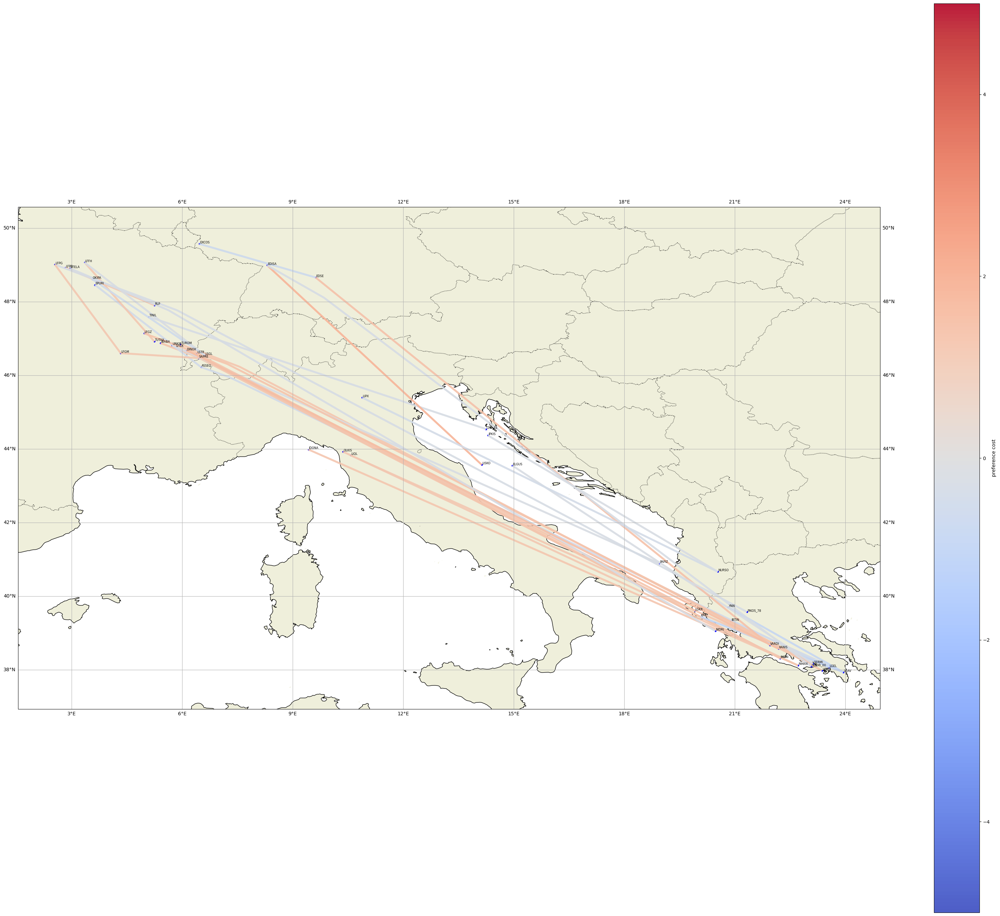

<GeoAxes: >

In [6]:
plot_edge_preferences_cartopy(
    payload["graph"],
    edge_preferences=payload["edge_preferences"],
    cmap="coolwarm",
    linewidth=4,
    alpha=0.9,
    percentile=0.015,
    percentile_mode="contrast", # upper = more preferred, lower = less preferred, contrast = half lowest, half highest
    preference_color_range=(-5,5),
    show_waypoints=True
)

# Raw prior route traversal frequency

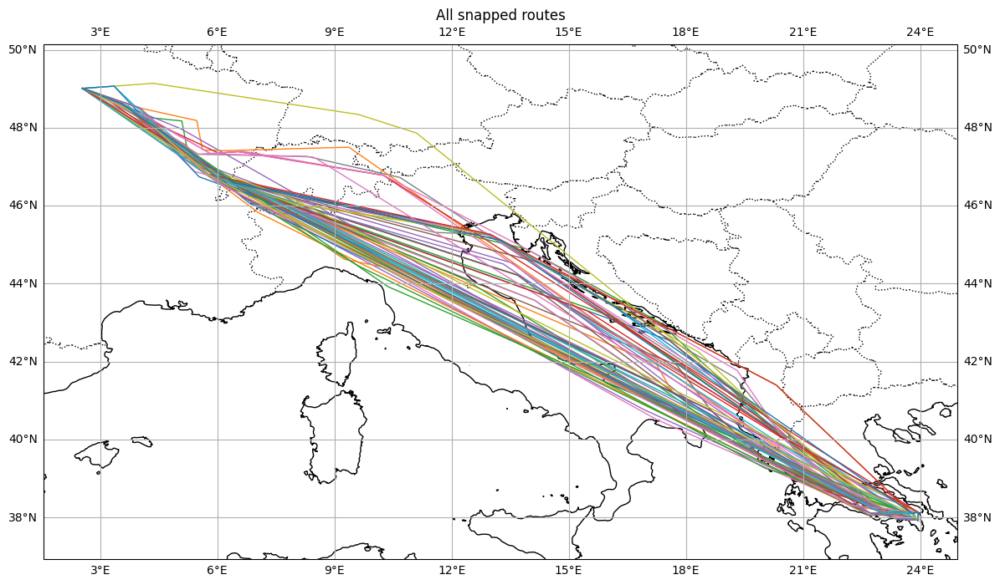

(<Figure size 1800x800 with 1 Axes>,
 <GeoAxes: title={'center': 'All snapped routes'}>)

In [7]:
from equinox.posttrain.plot_sample_routes import plot_snapped_routes
plot_snapped_routes(case_dir=Path("data/cases/LGAV_LFPG"), show_waypoints=False)

# Route cost decomposition and inspection

In [8]:
from equinox.posttrain.cost_back_envelope import compute_route_cost_breakdown, breakdown_to_frame

reference_flight_id = "468D07SEH902"
reference_takeoff_timestamp = 1681366351

result = compute_route_cost_breakdown(
    checkpoint_path=latest_checkpoint_filename,
    case_dir=case_dir,
    flight_id=reference_flight_id,
    takeoff_time=reference_takeoff_timestamp
)

df = breakdown_to_frame(result["breakdown"])
print_params_table(result["totals"])
df


All components initialized successfully:
  - Graph loaded with 600 nodes
  - Origin: LGAV (idx: 174)
  - Goal: LFPG (idx: 95)
  - Device: cpu
  - Distance matrix shape: (600, 600)
  - Charges matrix shape: (600, 600)


     Common Parameters      
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━┓
┃ Parameter    ┃     Value ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━┩
│ cost_bias    │  0.344825 │
│ cost_ac_dist │ -1.374677 │
│ cost_time    │  1.874383 │
│ cost_prefer… │  0.224290 │
│ cost_common  │  0.844530 │
│ cost_total   │  1.068821 │
└──────────────┴───────────┘

,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.886719,25.460000,-12.310090,False,1.0,6.336159,3.411555,0.057471,-0.001668,0.011607,0.057471,-0.010567,0.039599,-0.009562,0.086503,0.076940
1,XORKI,GERMI,560,229,18.162265,25.460000,-34.580778,False,1.0,4.624113,2.623220,0.057471,-0.001668,0.011607,0.057471,-0.007712,0.030448,0.105964,0.080208,0.186171
2,GERMI,LUMAR_43,229,125,329.143821,44.937383,-41.474037,False,1.0,147.908620,48.341185,0.057471,-0.001668,0.011607,0.057471,-0.246665,0.561107,-0.016980,0.371913,0.354933
3,LUMAR_43,LISKO,125,459,193.820580,75.050869,-22.107376,False,1.0,145.464030,27.177928,0.057471,-0.001668,0.011607,0.057471,-0.242588,0.315460,-0.016980,0.130343,0.113363
4,LISKO,DINOX,459,298,386.737469,92.780407,-10.981812,False,1.0,358.816599,52.854867,0.057471,-0.001668,0.011607,0.057471,-0.598394,0.613499,0.038094,0.072576,0.110670
5,DINOX,LFPG,298,95,201.234901,80.081594,-4.054808,False,1.0,161.152116,27.075287,0.057471,-0.001668,0.011607,0.057471,-0.268751,0.314269,0.123755,0.102989,0.226743


# Inference/Sampling

In [9]:
from pathlib import Path 

from equinox.sampling.pipeline import compute_4d_path_for_dataset
from equinox.posttrain.plot_sample_routes import plot_sample_routes

res = compute_4d_path_for_dataset(
    case_dir=Path("data/cases/LGAV_LFPG"),
    checkpoint_path=Path(latest_checkpoint_filename),
    flight_id=reference_flight_id,
    takeoff_timestamp=reference_takeoff_timestamp,
    n_samples=200,
    policy="sample",
    output_dir=Path(f"data/cases/LGAV_LFPG/inference_flight_{reference_flight_id}"),
    seed=7,
)

All components initialized successfully:
  - Graph loaded with 600 nodes
  - Origin: LGAV (idx: 174)
  - Goal: LFPG (idx: 95)
  - Device: cpu
  - Distance matrix shape: (600, 600)
  - Charges matrix shape: (600, 600)
Goal LFPG reached at step 8.
Goal LFPG reached at step 3.
Goal LFPG reached at step 7.
Goal LFPG reached at step 4.
Goal LFPG reached at step 5.
Goal LFPG reached at step 8.
Goal LFPG reached at step 5.
Goal LFPG reached at step 5.
Goal LFPG reached at step 2.
Goal LFPG reached at step 6.
Goal LFPG reached at step 7.
Goal LFPG reached at step 4.
Goal LFPG reached at step 8.
Goal LFPG reached at step 3.
Goal LFPG reached at step 4.
Goal LFPG reached at step 4.
Goal LFPG reached at step 4.
Goal LFPG reached at step 6.
Goal LFPG reached at step 5.
Goal LFPG reached at step 5.
Goal LFPG reached at step 5.
Goal LFPG reached at step 5.
Goal LFPG reached at step 5.
Goal LFPG reached at step 6.
Goal LFPG reached at step 5.
Goal LFPG reached at step 7.
Goal LFPG reached at step 5.


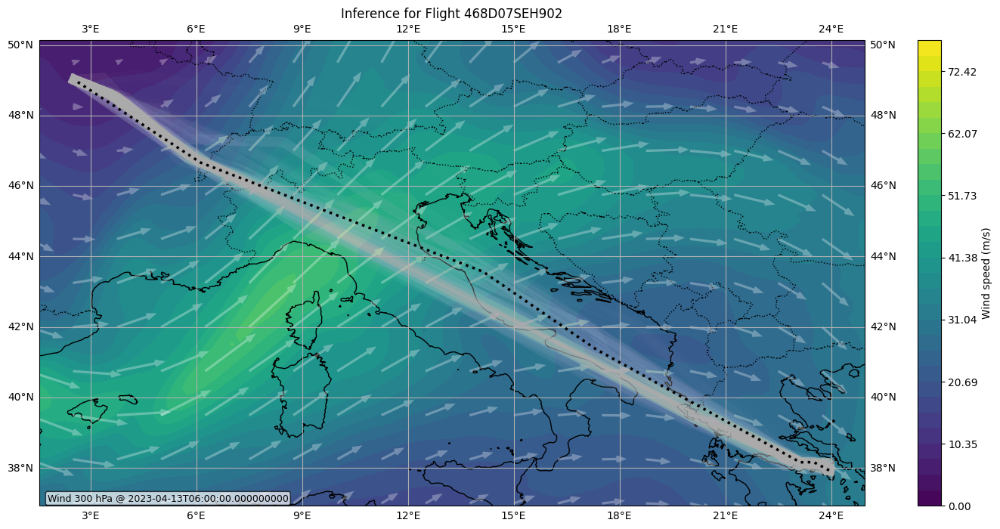

(<Figure size 1800x800 with 2 Axes>,
 <GeoAxes: title={'center': 'Inference for Flight 468D07SEH902'}>)

In [10]:

plot_sample_routes(
    case_dir=Path("data/cases/LGAV_LFPG"),
    routes_path=Path(f"data/cases/LGAV_LFPG/inference_flight_{reference_flight_id}/routes.txt"),
    show=True,
    show_waypoints=False,
    route_alpha=0.01,
    reference_flight_id=reference_flight_id,
    reference_takeoff_timestamp=reference_takeoff_timestamp,
    plot_wind = True,
    show_quiver = True,
    thickness = 10,
    plot_title=f"Inference for Flight {reference_flight_id}"
)

All components initialized successfully:
  - Graph loaded with 600 nodes
  - Origin: LGAV (idx: 174)
  - Goal: LFPG (idx: 95)
  - Device: cpu
  - Distance matrix shape: (600, 600)
  - Charges matrix shape: (600, 600)
Route 1/100: LGAV -> GERMI -> DJL -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,DJL,229,330,961.284,70.685,-48.504,False,1.0,679.484,143.655,0.057,-0.002,0.012,0.057,-1.133,1.667,-0.055,0.592,0.537
2,DJL,OKIPA,330,232,101.405,80.072,-22.395,False,1.0,81.197,14.229,0.057,-0.002,0.012,0.057,-0.135,0.165,-0.055,0.087,0.033
3,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.230, ac_dist=-1.348, time=1.974, preference=-0.123, total=0.732


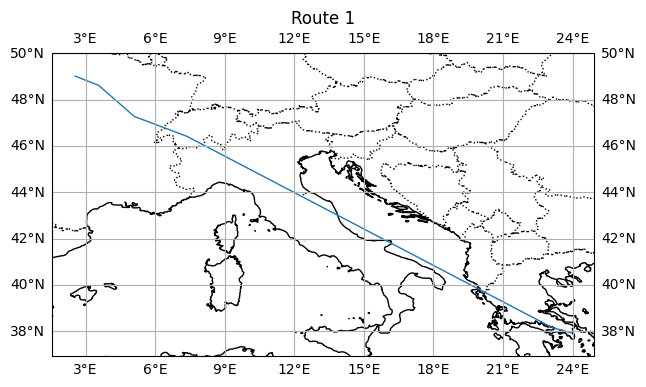

Route 2/100: LGAV -> GERMI -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,LFPG,229,95,1100.755,73.318,-33.691,False,1.0,807.055,158.645,0.057,-0.002,0.012,0.057,-1.346,1.841,0.094,0.553,0.647


Totals: bias=0.115, ac_dist=-1.363, time=1.909, preference=0.084, total=0.744


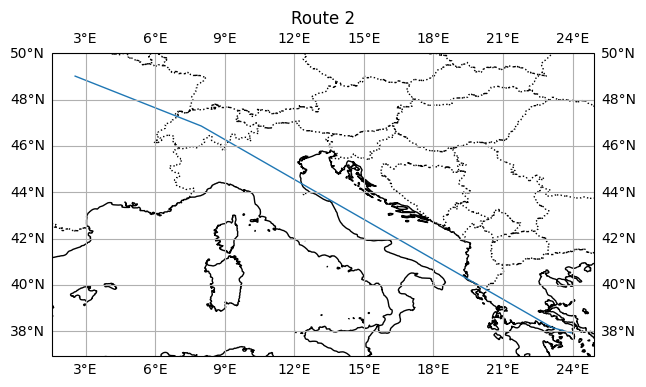

Route 3/100: LGAV -> LGKN -> RIMAX -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,RIMAX,200,230,58.380,25.460,-22.538,False,1.0,14.863,8.194,0.057,-0.002,0.012,0.057,-0.025,0.095,-0.078,0.128,0.050
2,RIMAX,LFPG,230,95,1088.638,73.736,-33.133,False,1.0,802.718,156.689,0.057,-0.002,0.012,0.057,-1.339,1.819,0.107,0.538,0.644


Totals: bias=0.172, ac_dist=-1.369, time=1.933, preference=0.017, total=0.754


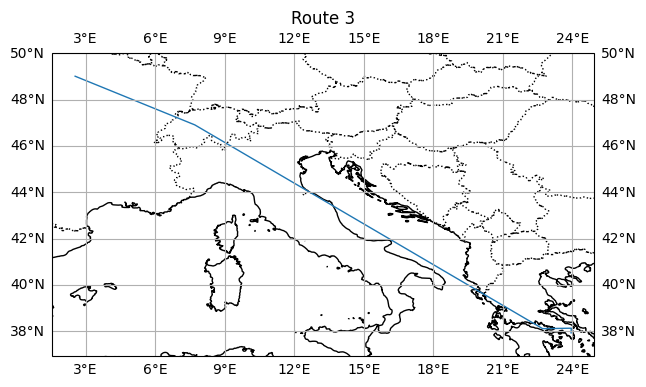

Route 4/100: LGAV -> GERMI -> KRK -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,LFPG,234,95,943.999,81.222,-32.979,False,1.0,766.732,135.820,0.057,-0.002,0.012,0.057,-1.279,1.576,0.027,0.355,0.382


Totals: bias=0.172, ac_dist=-1.365, time=1.936, preference=0.016, total=0.759


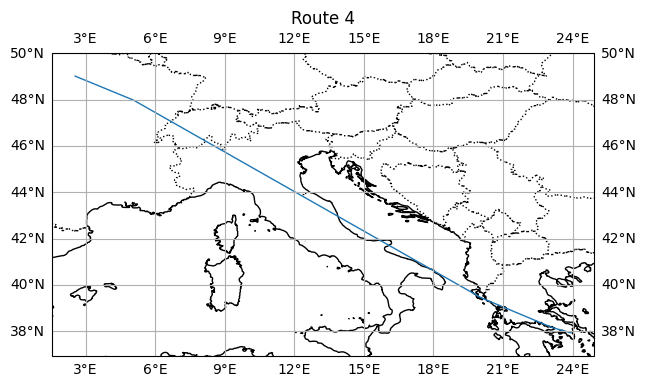

Route 5/100: LGAV -> LGKN -> GERMI -> DJL -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,DJL,229,330,961.284,70.685,-48.504,False,1.0,679.484,143.655,0.057,-0.002,0.012,0.057,-1.133,1.667,-0.055,0.592,0.537
3,DJL,OKIPA,330,232,101.405,80.072,-22.395,False,1.0,81.197,14.229,0.057,-0.002,0.012,0.057,-0.135,0.165,-0.055,0.087,0.033
4,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.287, ac_dist=-1.353, time=1.990, preference=-0.161, total=0.764


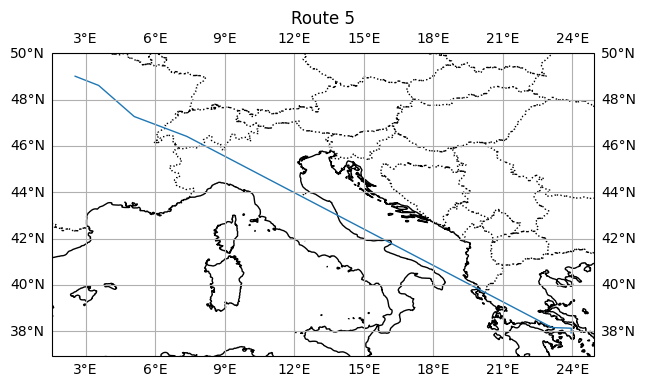

Route 6/100: LGAV -> LGMG -> GERMI_00 -> XANIS -> LGKR -> LERDU -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGMG,174,124,27.511,25.460,-8.654,False,1.0,7.004,3.740,0.057,-0.002,0.012,0.057,-0.012,0.043,-0.024,0.089,0.065
1,LGMG,GERMI_00,124,492,15.473,25.460,-42.629,False,1.0,3.939,2.279,0.057,-0.002,0.012,0.057,-0.007,0.026,-0.032,0.077,0.045
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
4,LGKR,LERDU,270,52,752.241,79.147,-52.517,False,1.0,595.376,113.551,0.057,-0.002,0.012,0.057,-0.993,1.318,-0.052,0.383,0.331
5,LERDU,URELO,52,221,132.547,80.075,-25.576,False,1.0,106.136,18.738,0.057,-0.002,0.012,0.057,-0.177,0.217,-0.052,0.098,0.046
6,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.402, ac_dist=-1.335, time=2.005, preference=-0.302, total=0.771


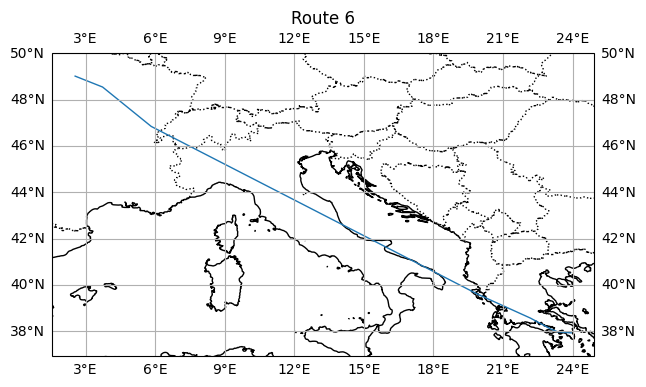

Route 7/100: LGAV -> GERMI -> DINOX -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,DINOX,229,298,907.247,68.628,-51.919,False,1.0,622.624,136.743,0.057,-0.002,0.012,0.057,-1.038,1.587,-0.001,0.606,0.606
2,DINOX,URELO,298,221,148.236,80.076,-26.755,False,1.0,118.701,21.014,0.057,-0.002,0.012,0.057,-0.198,0.244,-0.055,0.103,0.048
3,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.230, ac_dist=-1.327, time=1.985, preference=-0.094, total=0.794


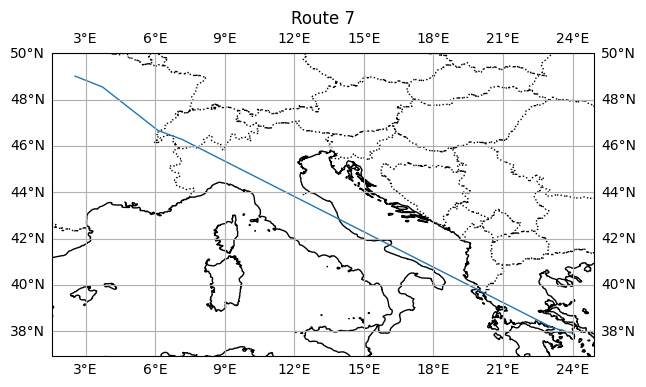

Route 8/100: LGAV -> GERMI -> WEBCA -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,WEBCA,229,583,864.393,63.322,-55.991,False,1.0,547.352,131.631,0.057,-0.002,0.012,0.057,-0.913,1.528,-0.054,0.673,0.619
2,WEBCA,URELO,583,221,194.839,86.949,-30.786,False,1.0,169.410,27.886,0.057,-0.002,0.012,0.057,-0.283,0.324,-0.054,0.099,0.045
3,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.230, ac_dist=-1.286, time=2.006, preference=-0.146, total=0.804


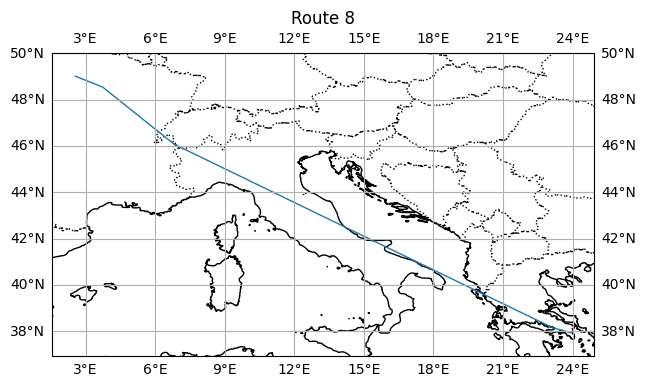

Route 9/100: LGAV -> LGKN -> RIMAX -> FASAN_32 -> URQAP -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,RIMAX,200,230,58.380,25.460,-22.538,False,1.0,14.863,8.194,0.057,-0.002,0.012,0.057,-0.025,0.095,-0.078,0.128,0.050
2,RIMAX,FASAN_32,230,42,291.639,41.179,-59.701,False,1.0,120.095,44.833,0.057,-0.002,0.012,0.057,-0.200,0.520,-0.021,0.378,0.356
3,FASAN_32,URQAP,42,96,639.477,83.688,-45.203,False,1.0,535.166,94.785,0.057,-0.002,0.012,0.057,-0.892,1.100,-0.021,0.265,0.244
4,URQAP,OKIPA,96,232,124.214,80.074,-24.543,False,1.0,99.463,17.517,0.057,-0.002,0.012,0.057,-0.166,0.203,-0.055,0.095,0.040
5,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.345, ac_dist=-1.351, time=2.012, preference=-0.192, total=0.814


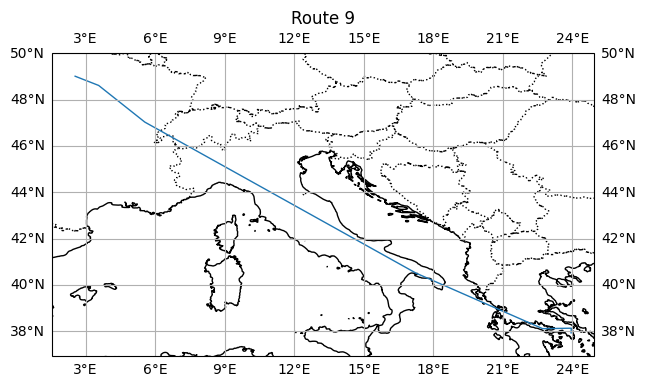

Route 10/100: LGAV -> GERMI -> LUKID -> LFFH -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,LUKID,229,147,930.687,66.326,-51.267,False,1.0,617.289,140.047,0.057,-0.002,0.012,0.057,-1.029,1.626,-0.071,0.654,0.583
2,LUKID,LFFH,147,84,164.826,80.076,-21.372,False,1.0,131.986,23.073,0.057,-0.002,0.012,0.057,-0.220,0.268,-0.071,0.105,0.034
3,LFFH,LFPG,84,95,31.977,80.070,-3.868,False,1.0,25.604,4.301,0.057,-0.002,0.012,0.057,-0.043,0.050,0.040,0.065,0.105


Totals: bias=0.230, ac_dist=-1.310, time=2.011, preference=-0.112, total=0.819


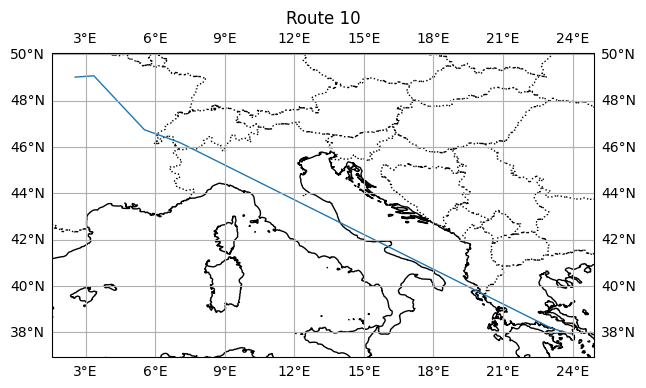

Route 11/100: LGAV -> LGKN -> IXONI -> KRK -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,IXONI,200,148,81.838,25.460,-30.841,False,1.0,20.836,11.715,0.057,-0.002,0.012,0.057,-0.035,0.136,-0.054,0.159,0.105
2,IXONI,KRK,148,234,121.571,25.460,-65.842,False,1.0,30.952,18.988,0.057,-0.002,0.012,0.057,-0.052,0.220,0.048,0.226,0.274
3,KRK,LFPG,234,95,943.999,81.222,-32.979,False,1.0,766.732,135.820,0.057,-0.002,0.012,0.057,-1.279,1.576,0.027,0.355,0.382


Totals: bias=0.230, ac_dist=-1.370, time=1.952, preference=0.009, total=0.821


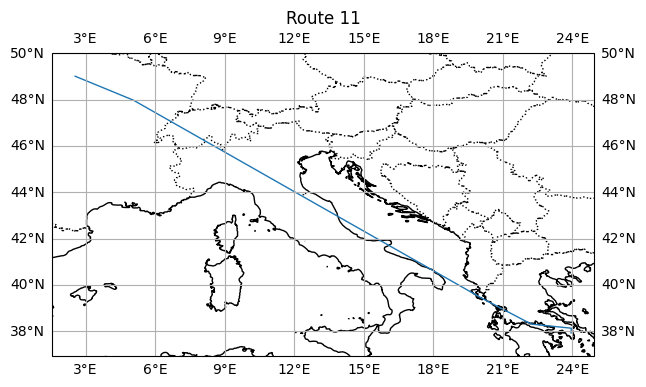

Route 12/100: LGAV -> GERMI -> OMIDO -> JAVVU -> NANOP -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,OMIDO,229,197,844.034,67.416,-52.792,False,1.0,569.016,127.495,0.057,-0.002,0.012,0.057,-0.949,1.480,-0.013,0.588,0.575
2,OMIDO,JAVVU,197,397,106.751,129.359,-42.867,False,1.0,138.092,15.732,0.057,-0.002,0.012,0.057,-0.230,0.183,-0.013,0.010,-0.003
3,JAVVU,NANOP,397,26,85.100,80.072,-28.517,False,1.0,68.141,12.114,0.057,-0.002,0.012,0.057,-0.114,0.141,-0.035,0.084,0.050
4,NANOP,LFPG,26,95,80.749,80.070,-13.435,False,1.0,64.656,11.098,0.057,-0.002,0.012,0.057,-0.108,0.129,0.026,0.078,0.105


Totals: bias=0.287, ac_dist=-1.418, time=1.999, preference=-0.045, total=0.823


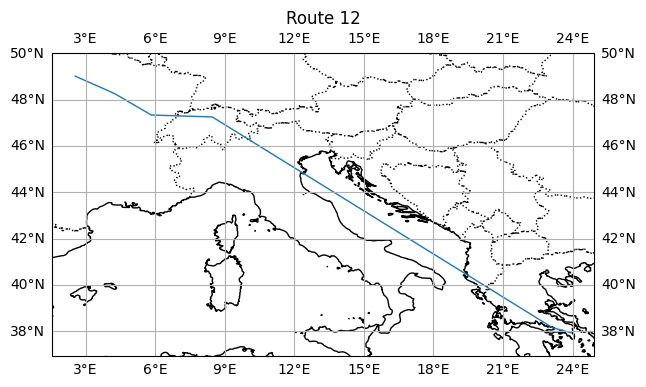

Route 13/100: LGAV -> LGKN -> RIMAX -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,RIMAX,200,230,58.380,25.460,-22.538,False,1.0,14.863,8.194,0.057,-0.002,0.012,0.057,-0.025,0.095,-0.078,0.128,0.050
2,RIMAX,UNKIR,230,349,912.782,69.075,-50.730,False,1.0,630.502,137.168,0.057,-0.002,0.012,0.057,-1.051,1.592,0.032,0.598,0.631
3,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.230, ac_dist=-1.327, time=2.002, preference=-0.081, total=0.824


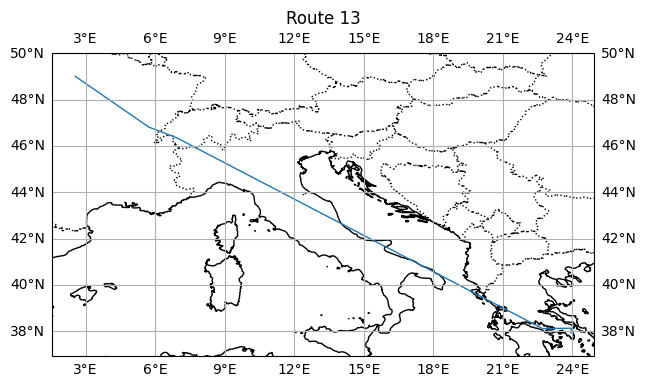

Route 14/100: LGAV -> LGKN -> GERMI -> DINOX -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,DINOX,229,298,907.247,68.628,-51.919,False,1.0,622.624,136.743,0.057,-0.002,0.012,0.057,-1.038,1.587,-0.001,0.606,0.606
3,DINOX,URELO,298,221,148.236,80.076,-26.755,False,1.0,118.701,21.014,0.057,-0.002,0.012,0.057,-0.198,0.244,-0.055,0.103,0.048
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.331, time=2.001, preference=-0.131, total=0.826


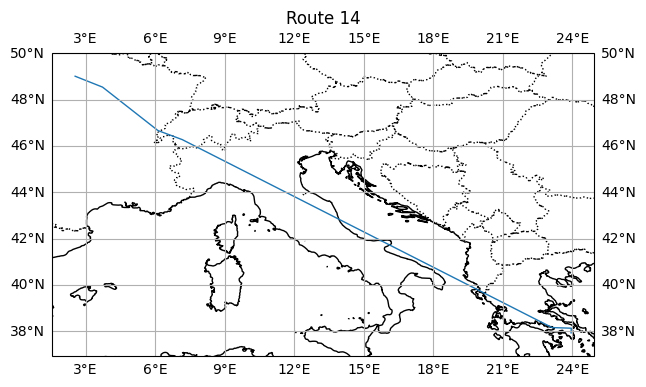

Route 15/100: LGAV -> GERMI -> PIKEL -> LSTR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,PIKEL,229,5,329.817,41.459,-64.213,False,1.0,136.741,51.295,0.057,-0.002,0.012,0.057,-0.228,0.595,-0.023,0.425,0.402
2,PIKEL,LSTR,5,272,566.690,84.286,-50.471,False,1.0,477.641,85.104,0.057,-0.002,0.012,0.057,-0.797,0.988,-0.023,0.249,0.226
3,LSTR,URELO,272,221,159.275,84.336,-28.337,False,1.0,134.326,22.664,0.057,-0.002,0.012,0.057,-0.224,0.263,-0.038,0.097,0.058
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.339, time=2.000, preference=-0.121, total=0.827


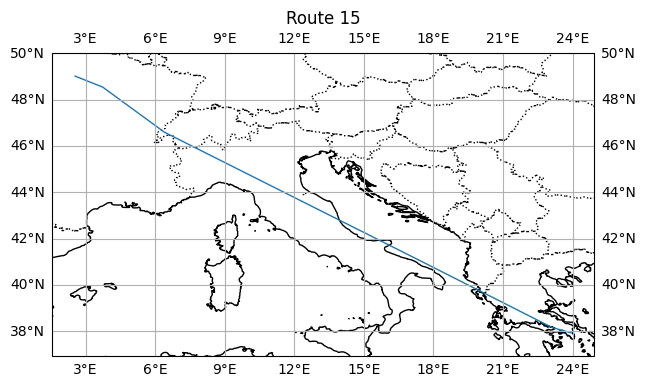

Route 16/100: LGAV -> GERMI -> LSTR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,LSTR,229,272,894.876,68.633,-52.642,False,1.0,614.176,135.124,0.057,-0.002,0.012,0.057,-1.024,1.568,0.033,0.602,0.634
2,LSTR,URELO,272,221,159.275,84.336,-28.337,False,1.0,134.326,22.664,0.057,-0.002,0.012,0.057,-0.224,0.263,-0.038,0.097,0.058
3,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.230, ac_dist=-1.339, time=1.986, preference=-0.043, total=0.833


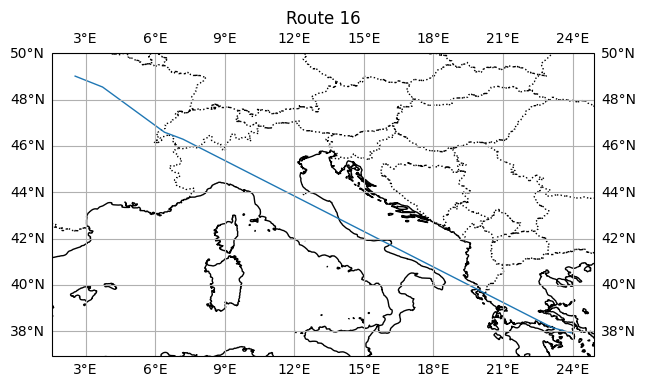

Route 17/100: LGAV -> LGKN -> IXONI -> GOLAS -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,IXONI,200,148,81.838,25.460,-30.841,False,1.0,20.836,11.715,0.057,-0.002,0.012,0.057,-0.035,0.136,-0.054,0.159,0.105
2,IXONI,GOLAS,148,413,676.182,62.115,-53.960,False,1.0,420.012,102.442,0.057,-0.002,0.012,0.057,-0.700,1.189,-0.027,0.546,0.519
3,GOLAS,UNKIR,413,349,216.203,92.441,-43.075,False,1.0,199.860,31.879,0.057,-0.002,0.012,0.057,-0.333,0.370,-0.027,0.094,0.067
4,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.287, ac_dist=-1.319, time=2.010, preference=-0.144, total=0.834


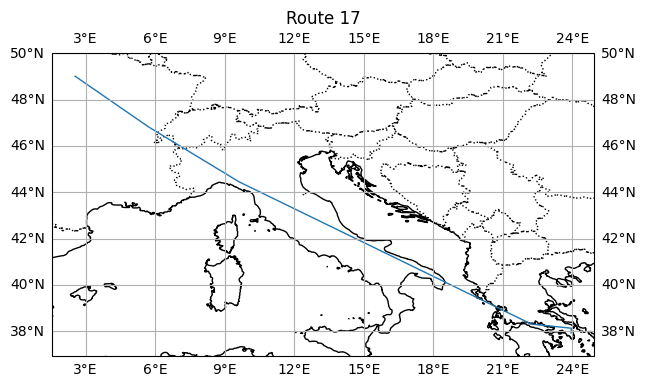

Route 18/100: LGAV -> LGKN -> GERMI -> WEBCA -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,WEBCA,229,583,864.393,63.322,-55.991,False,1.0,547.352,131.631,0.057,-0.002,0.012,0.057,-0.913,1.528,-0.054,0.673,0.619
3,WEBCA,URELO,583,221,194.839,86.949,-30.786,False,1.0,169.410,27.886,0.057,-0.002,0.012,0.057,-0.283,0.324,-0.054,0.099,0.045
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.290, time=2.021, preference=-0.183, total=0.835


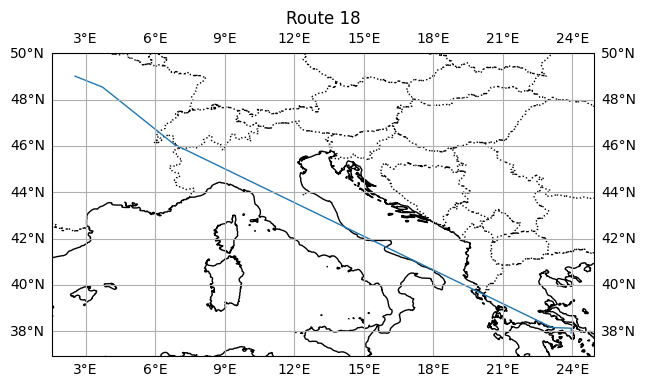

Route 19/100: LGAV -> GERMI -> LGKR -> LERDU -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,LGKR,229,270,173.120,25.460,-64.068,False,1.0,44.076,26.915,0.057,-0.002,0.012,0.057,-0.074,0.312,0.028,0.296,0.324
2,LGKR,LERDU,270,52,752.241,79.147,-52.517,False,1.0,595.376,113.551,0.057,-0.002,0.012,0.057,-0.993,1.318,-0.052,0.383,0.331
3,LERDU,URELO,52,221,132.547,80.075,-25.576,False,1.0,106.136,18.738,0.057,-0.002,0.012,0.057,-0.177,0.217,-0.052,0.098,0.046
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.334, time=2.002, preference=-0.114, total=0.842


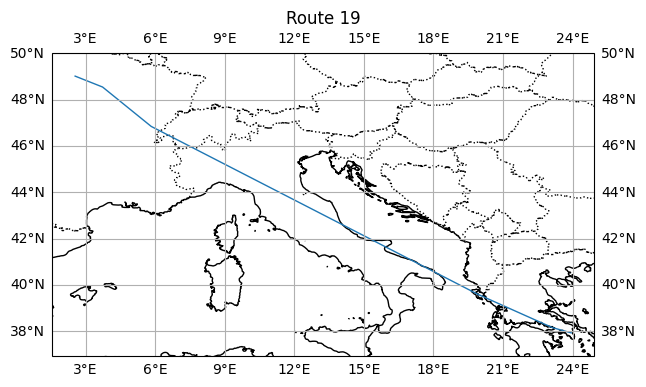

Route 20/100: LGAV -> LGKN -> GERMI -> LUKID -> LFFH -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,LUKID,229,147,930.687,66.326,-51.267,False,1.0,617.289,140.047,0.057,-0.002,0.012,0.057,-1.029,1.626,-0.071,0.654,0.583
3,LUKID,LFFH,147,84,164.826,80.076,-21.372,False,1.0,131.986,23.073,0.057,-0.002,0.012,0.057,-0.220,0.268,-0.071,0.105,0.034
4,LFFH,LFPG,84,95,31.977,80.070,-3.868,False,1.0,25.604,4.301,0.057,-0.002,0.012,0.057,-0.043,0.050,0.040,0.065,0.105


Totals: bias=0.287, ac_dist=-1.314, time=2.026, preference=-0.149, total=0.850


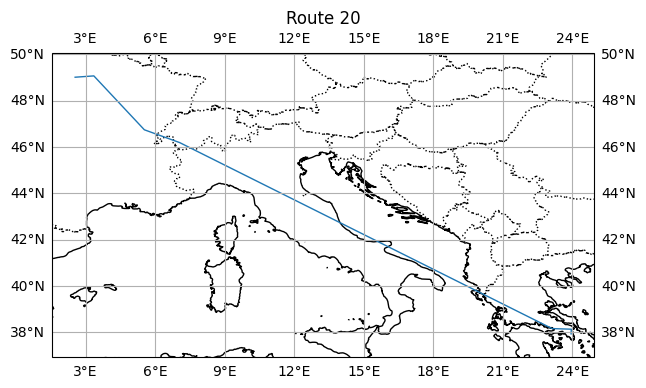

Route 21/100: LGAV -> LGKN -> GERMI -> OMIDO -> JAVVU -> NANOP -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,OMIDO,229,197,844.034,67.416,-52.792,False,1.0,569.016,127.495,0.057,-0.002,0.012,0.057,-0.949,1.480,-0.013,0.588,0.575
3,OMIDO,JAVVU,197,397,106.751,129.359,-42.867,False,1.0,138.092,15.732,0.057,-0.002,0.012,0.057,-0.230,0.183,-0.013,0.010,-0.003
4,JAVVU,NANOP,397,26,85.100,80.072,-28.517,False,1.0,68.141,12.114,0.057,-0.002,0.012,0.057,-0.114,0.141,-0.035,0.084,0.050
5,NANOP,LFPG,26,95,80.749,80.070,-13.435,False,1.0,64.656,11.098,0.057,-0.002,0.012,0.057,-0.108,0.129,0.026,0.078,0.105


Totals: bias=0.345, ac_dist=-1.422, time=2.015, preference=-0.082, total=0.855


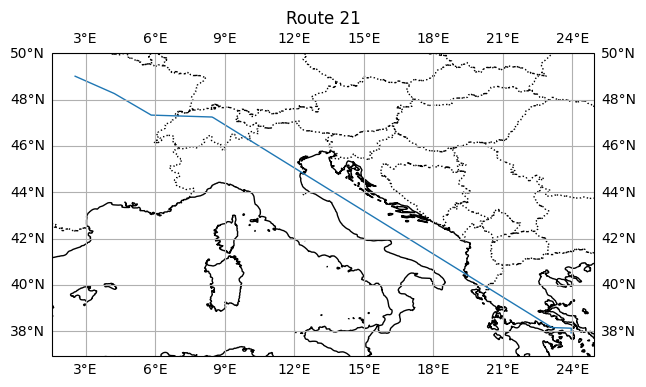

Route 22/100: LGAV -> LGKN -> IXONI -> SIROD -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,IXONI,200,148,81.838,25.460,-30.841,False,1.0,20.836,11.715,0.057,-0.002,0.012,0.057,-0.035,0.136,-0.054,0.159,0.105
2,IXONI,SIROD,148,114,874.626,70.655,-50.723,False,1.0,617.967,131.431,0.057,-0.002,0.012,0.057,-1.031,1.526,0.017,0.552,0.569
3,SIROD,OKIPA,114,232,150.517,80.076,-25.926,False,1.0,120.528,21.296,0.057,-0.002,0.012,0.057,-0.201,0.247,-0.037,0.104,0.066
4,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.287, ac_dist=-1.334, time=2.002, preference=-0.090, total=0.865


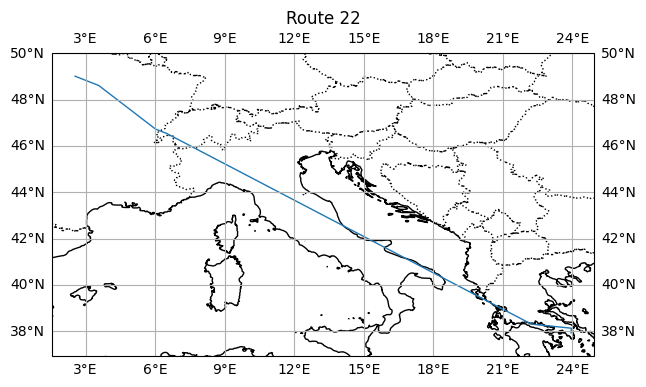

Route 23/100: LGAV -> LGMG -> GERMI_00 -> XANIS -> LGKR -> KONIL -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGMG,174,124,27.511,25.460,-8.654,False,1.0,7.004,3.740,0.057,-0.002,0.012,0.057,-0.012,0.043,-0.024,0.089,0.065
1,LGMG,GERMI_00,124,492,15.473,25.460,-42.629,False,1.0,3.939,2.279,0.057,-0.002,0.012,0.057,-0.007,0.026,-0.032,0.077,0.045
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
4,LGKR,KONIL,270,238,721.589,78.352,-53.647,False,1.0,565.380,109.234,0.057,-0.002,0.012,0.057,-0.943,1.268,-0.015,0.383,0.368
5,KONIL,OKIPA,238,232,169.638,85.401,-28.157,False,1.0,144.873,24.128,0.057,-0.002,0.012,0.057,-0.242,0.280,-0.015,0.096,0.081
6,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.402, ac_dist=-1.339, time=2.005, preference=-0.203, total=0.865


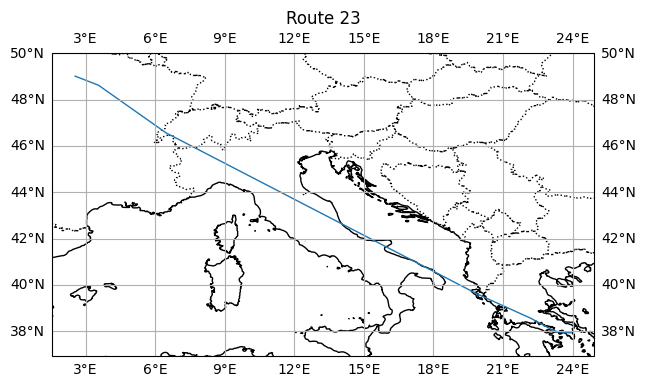

Route 24/100: LGAV -> XORKI -> XANIS -> LGKR -> IVLOX_46 -> MONEB -> GIVRI -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.887,25.460,-24.845,False,1.0,6.336,3.512,0.057,-0.002,0.012,0.057,-0.011,0.041,-0.010,0.088,0.078
1,XORKI,XANIS,560,319,66.815,25.460,-53.696,False,1.0,17.011,10.116,0.057,-0.002,0.012,0.057,-0.028,0.117,0.028,0.147,0.175
2,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
3,LGKR,IVLOX_46,270,87,519.588,70.317,-54.833,False,1.0,365.360,78.891,0.057,-0.002,0.012,0.057,-0.609,0.916,-0.051,0.364,0.313
4,IVLOX_46,MONEB,87,32,43.587,75.050,-48.545,False,1.0,32.712,6.514,0.057,-0.002,0.012,0.057,-0.055,0.076,-0.051,0.079,0.028
5,MONEB,GIVRI,32,109,228.470,95.885,-38.573,False,1.0,219.067,33.319,0.057,-0.002,0.012,0.057,-0.365,0.387,-0.050,0.079,0.028
6,GIVRI,OKIPA,109,232,106.723,80.073,0.000,True,1.0,85.457,14.230,0.057,-0.002,0.012,0.057,-0.143,0.165,-0.050,0.080,0.030
7,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.460, ac_dist=-1.325, time=1.997, preference=-0.265, total=0.867


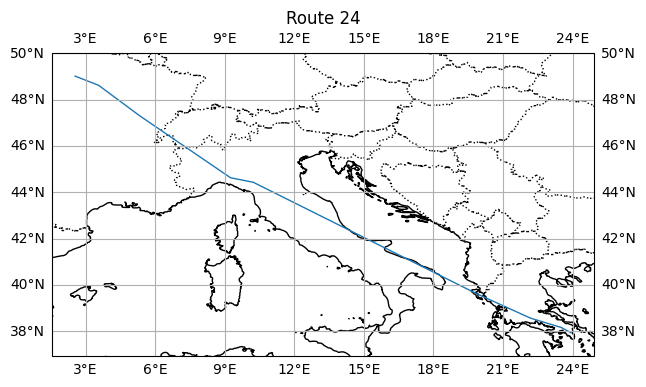

Route 25/100: LGAV -> LGKN -> GERMI_00 -> XANIS -> LGKR -> LERDU -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI_00,200,492,41.647,25.460,-20.162,False,1.0,10.603,5.813,0.057,-0.002,0.012,0.057,-0.018,0.067,0.041,0.107,0.148
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
4,LGKR,LERDU,270,52,752.241,79.147,-52.517,False,1.0,595.376,113.551,0.057,-0.002,0.012,0.057,-0.993,1.318,-0.052,0.383,0.331
5,LERDU,URELO,52,221,132.547,80.075,-25.576,False,1.0,106.136,18.738,0.057,-0.002,0.012,0.057,-0.177,0.217,-0.052,0.098,0.046
6,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.402, ac_dist=-1.339, time=2.022, preference=-0.216, total=0.869


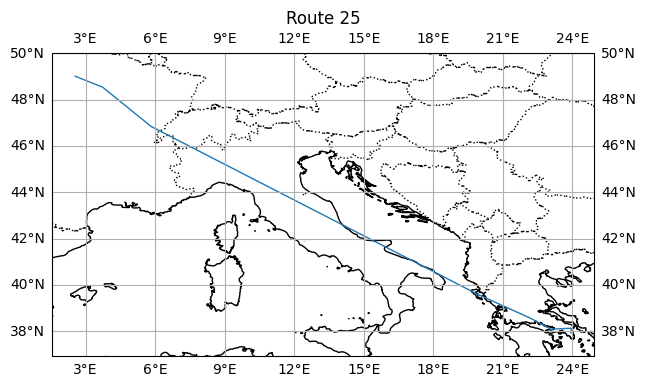

Route 26/100: LGAV -> LGMG -> GERMI_00 -> XANIS -> LGKR -> DAMIC -> BAKEP_11 -> TUROM -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGMG,174,124,27.511,25.460,-8.654,False,1.0,7.004,3.740,0.057,-0.002,0.012,0.057,-0.012,0.043,-0.024,0.089,0.065
1,LGMG,GERMI_00,124,492,15.473,25.460,-42.629,False,1.0,3.939,2.279,0.057,-0.002,0.012,0.057,-0.007,0.026,-0.032,0.077,0.045
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
4,LGKR,DAMIC,270,321,91.184,47.350,-62.613,False,1.0,43.175,14.123,0.057,-0.002,0.012,0.057,-0.072,0.164,-0.015,0.149,0.135
5,DAMIC,BAKEP_11,321,100,341.959,75.063,-54.318,False,1.0,256.684,51.854,0.057,-0.002,0.012,0.057,-0.428,0.602,-0.015,0.231,0.216
6,BAKEP_11,TUROM,100,237,315.063,98.563,-49.953,False,1.0,310.535,47.254,0.057,-0.002,0.012,0.057,-0.518,0.548,-0.015,0.088,0.073
7,TUROM,LFPG,237,95,189.325,80.080,-18.043,False,1.0,151.612,26.298,0.057,-0.002,0.012,0.057,-0.253,0.305,-0.014,0.110,0.095


Totals: bias=0.460, ac_dist=-1.363, time=2.002, preference=-0.229, total=0.870


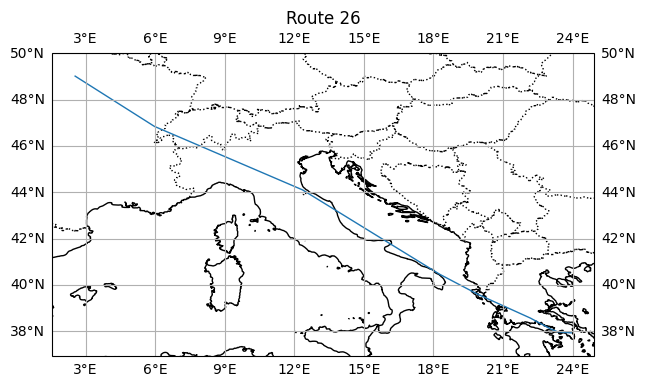

Route 27/100: LGAV -> GERMI -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,UNKIR,229,349,925.713,68.207,-51.053,False,1.0,631.398,139.224,0.057,-0.002,0.012,0.057,-1.053,1.616,0.081,0.620,0.701
2,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.172, ac_dist=-1.316, time=1.979, preference=0.047, total=0.883


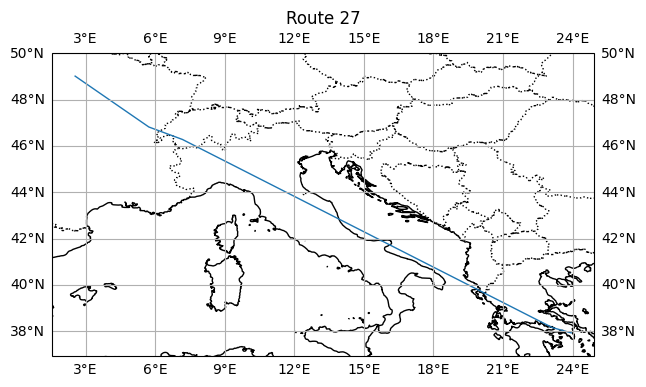

Route 28/100: LGAV -> LGKN -> RIMAX -> LIBV -> ARBOS_89 -> LFQB -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,RIMAX,200,230,58.380,25.460,-22.538,False,1.0,14.863,8.194,0.057,-0.002,0.012,0.057,-0.025,0.095,-0.078,0.128,0.050
2,RIMAX,LIBV,230,593,311.687,43.029,-60.705,False,1.0,134.117,48.039,0.057,-0.002,0.012,0.057,-0.224,0.558,-0.015,0.391,0.377
3,LIBV,ARBOS_89,593,44,588.215,81.136,-47.859,False,1.0,477.254,87.763,0.057,-0.002,0.012,0.057,-0.796,1.019,-0.015,0.280,0.266
4,ARBOS_89,LFQB,44,79,131.814,80.074,-26.545,False,1.0,105.549,18.677,0.057,-0.002,0.012,0.057,-0.176,0.217,-0.037,0.098,0.061
5,LFQB,LFPG,79,95,71.408,80.070,-12.790,False,1.0,57.176,9.800,0.057,-0.002,0.012,0.057,-0.095,0.114,-0.005,0.076,0.071


Totals: bias=0.345, ac_dist=-1.321, time=2.021, preference=-0.161, total=0.884


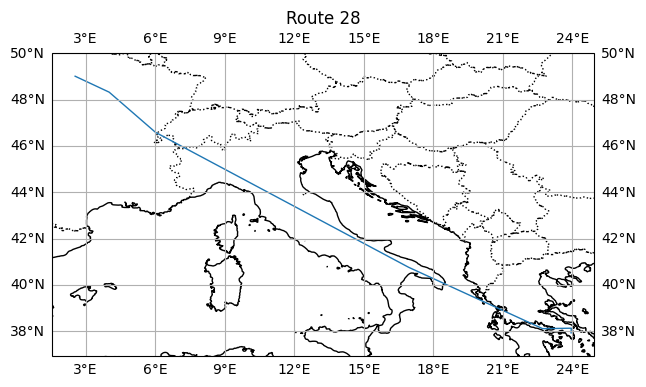

Route 29/100: LGAV -> LGKN -> PIKAD -> DINOX -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,PIKAD,200,389,59.477,25.460,-20.484,False,1.0,15.143,8.308,0.057,-0.002,0.012,0.057,-0.025,0.096,-0.015,0.129,0.114
2,PIKAD,DINOX,389,298,895.851,68.950,-51.552,False,1.0,617.686,134.901,0.057,-0.002,0.012,0.057,-1.030,1.566,0.029,0.593,0.623
3,DINOX,URELO,298,221,148.236,80.076,-26.755,False,1.0,118.701,21.014,0.057,-0.002,0.012,0.057,-0.198,0.244,-0.055,0.103,0.048
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.332, time=2.012, preference=-0.080, total=0.887


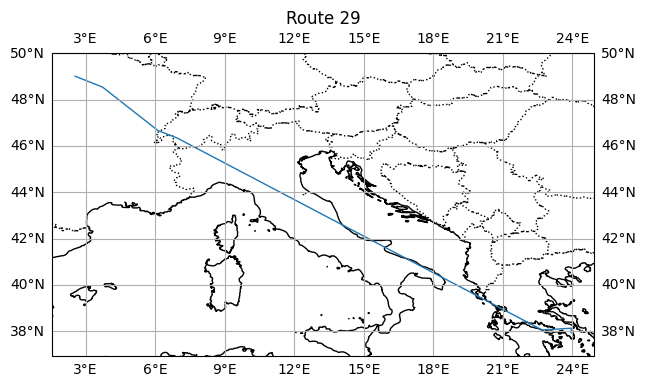

Route 30/100: LGAV -> GERMI -> PIKEL -> LSTR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,PIKEL,229,5,329.817,41.459,-64.213,False,1.0,136.741,51.295,0.057,-0.002,0.012,0.057,-0.228,0.595,-0.023,0.425,0.402
2,PIKEL,LSTR,5,272,566.690,84.286,-50.471,False,1.0,477.641,85.104,0.057,-0.002,0.012,0.057,-0.797,0.988,-0.023,0.249,0.226
3,LSTR,LFPG,272,95,212.660,83.196,-19.330,False,1.0,176.925,29.627,0.057,-0.002,0.012,0.057,-0.295,0.344,0.057,0.106,0.163


Totals: bias=0.230, ac_dist=-1.337, time=1.994, preference=0.001, total=0.888


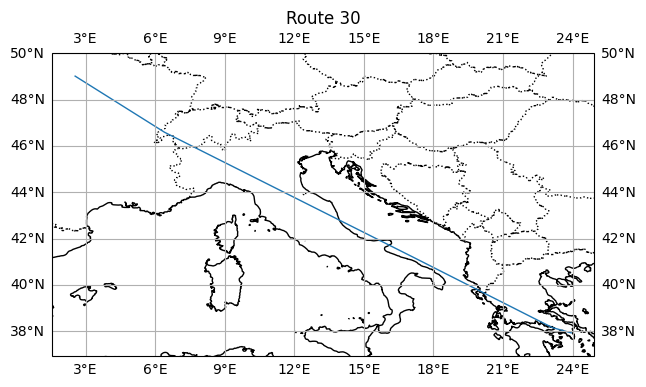

Route 31/100: LGAV -> LGKN -> PIKAD -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,PIKAD,200,389,59.477,25.460,-20.484,False,1.0,15.143,8.308,0.057,-0.002,0.012,0.057,-0.025,0.096,-0.015,0.129,0.114
2,PIKAD,UNKIR,389,349,914.319,69.095,-50.729,False,1.0,631.751,137.398,0.057,-0.002,0.012,0.057,-1.054,1.595,0.035,0.599,0.633
3,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.230, ac_dist=-1.329, time=2.006, preference=-0.016, total=0.891


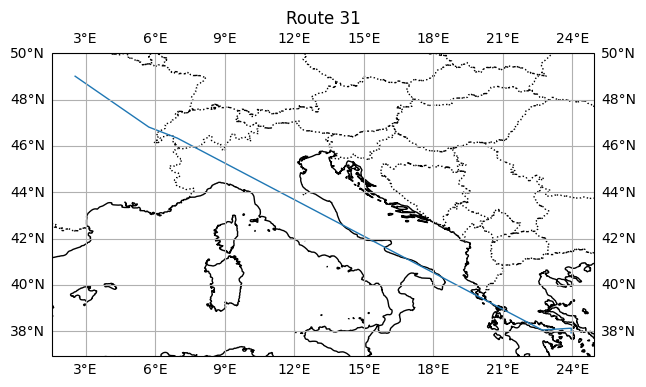

Route 32/100: LGAV -> GERMI -> LSTR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,LSTR,229,272,894.876,68.633,-52.642,False,1.0,614.176,135.124,0.057,-0.002,0.012,0.057,-1.024,1.568,0.033,0.602,0.634
2,LSTR,LFPG,272,95,212.660,83.196,-19.330,False,1.0,176.925,29.627,0.057,-0.002,0.012,0.057,-0.295,0.344,0.057,0.106,0.163


Totals: bias=0.172, ac_dist=-1.337, time=1.980, preference=0.079, total=0.894


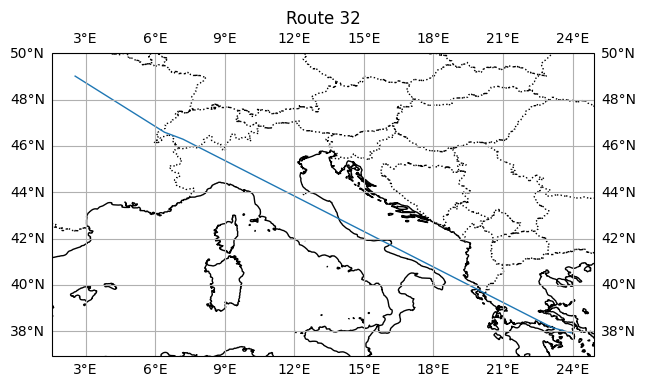

Route 33/100: LGAV -> GERMI -> LUMAR_43 -> LISKO -> LISMO -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,LUMAR_43,229,125,329.144,44.937,-65.964,False,1.0,147.909,51.424,0.057,-0.002,0.012,0.057,-0.247,0.597,-0.017,0.408,0.391
2,LUMAR_43,LISKO,125,459,193.821,75.051,-55.057,False,1.0,145.464,29.445,0.057,-0.002,0.012,0.057,-0.243,0.342,-0.017,0.157,0.140
3,LISKO,LISMO,459,403,404.736,94.019,-48.669,False,1.0,380.530,60.509,0.057,-0.002,0.012,0.057,-0.635,0.702,-0.000,0.125,0.125
4,LISMO,URELO,403,221,129.863,80.074,-25.380,False,1.0,103.987,18.350,0.057,-0.002,0.012,0.057,-0.173,0.213,0.002,0.097,0.099
5,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.345, ac_dist=-1.388, time=2.008, preference=-0.070, total=0.895


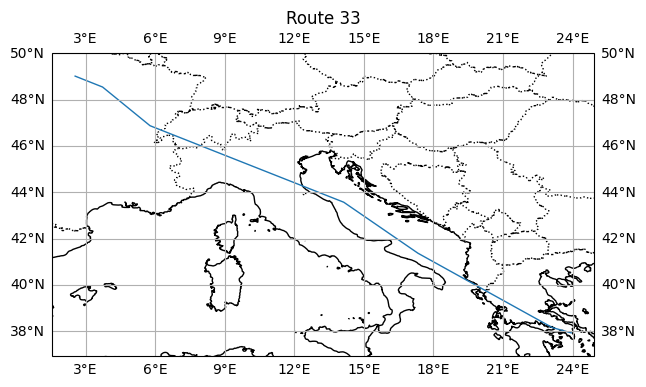

Route 34/100: LGAV -> LGMG -> GERMI_00 -> XANIS -> ENOXA -> AIOSA -> LSTR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGMG,174,124,27.511,25.460,-8.654,False,1.0,7.004,3.740,0.057,-0.002,0.012,0.057,-0.012,0.043,-0.024,0.089,0.065
1,LGMG,GERMI_00,124,492,15.473,25.460,-42.629,False,1.0,3.939,2.279,0.057,-0.002,0.012,0.057,-0.007,0.026,-0.032,0.077,0.045
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,ENOXA,319,187,261.131,46.389,-65.726,False,1.0,121.135,40.773,0.057,-0.002,0.012,0.057,-0.202,0.473,-0.018,0.329,0.311
4,ENOXA,AIOSA,187,578,47.559,74.699,-55.640,False,1.0,35.526,7.236,0.057,-0.002,0.012,0.057,-0.059,0.084,-0.018,0.082,0.064
5,AIOSA,LSTR,578,272,543.278,85.873,-54.149,False,1.0,466.527,82.346,0.057,-0.002,0.012,0.057,-0.778,0.956,-0.018,0.235,0.218
6,LSTR,URELO,272,221,159.275,84.336,-28.337,False,1.0,134.326,22.664,0.057,-0.002,0.012,0.057,-0.224,0.263,-0.038,0.097,0.058
7,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.460, ac_dist=-1.376, time=2.024, preference=-0.212, total=0.896


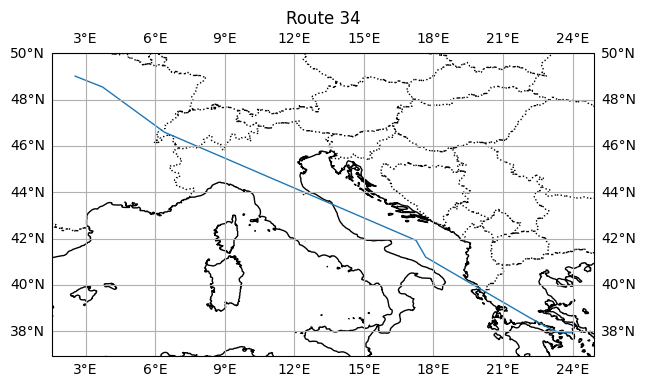

Route 35/100: LGAV -> XORKI -> GERMI -> DJL -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.887,25.460,-24.845,False,1.0,6.336,3.512,0.057,-0.002,0.012,0.057,-0.011,0.041,-0.010,0.088,0.078
1,XORKI,GERMI,560,229,18.162,25.460,-29.059,False,1.0,4.624,2.589,0.057,-0.002,0.012,0.057,-0.008,0.030,0.106,0.080,0.186
2,GERMI,DJL,229,330,961.284,70.685,-48.504,False,1.0,679.484,143.655,0.057,-0.002,0.012,0.057,-1.133,1.667,-0.055,0.592,0.537
3,DJL,OKIPA,330,232,101.405,80.072,-22.395,False,1.0,81.197,14.229,0.057,-0.002,0.012,0.057,-0.135,0.165,-0.055,0.087,0.033
4,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.287, ac_dist=-1.349, time=1.978, preference=-0.017, total=0.899


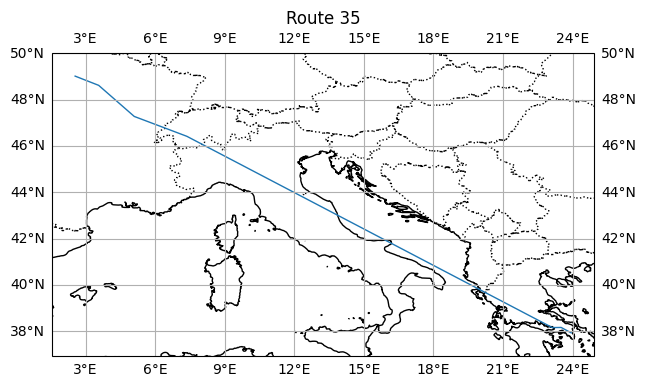

Route 36/100: LGAV -> GERMI -> NANOP -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,NANOP,229,26,1020.286,72.836,-48.417,False,1.0,743.138,152.440,0.057,-0.002,0.012,0.057,-1.239,1.769,0.118,0.588,0.705
2,NANOP,LFPG,26,95,80.749,80.070,-13.435,False,1.0,64.656,11.098,0.057,-0.002,0.012,0.057,-0.108,0.129,0.026,0.078,0.105


Totals: bias=0.172, ac_dist=-1.365, time=1.965, preference=0.134, total=0.907


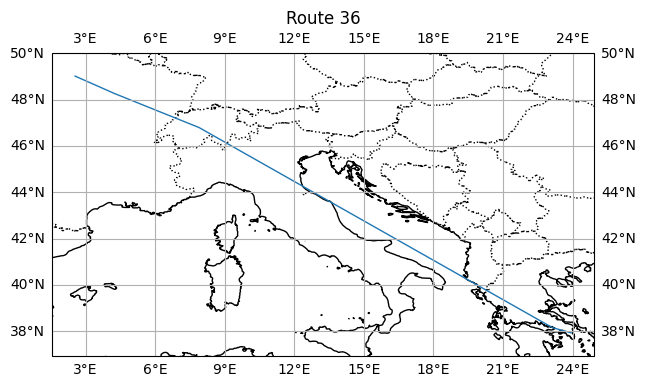

Route 37/100: LGAV -> GERMI -> GARTA -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,GARTA,229,361,112.527,25.460,-61.094,False,1.0,28.649,17.361,0.057,-0.002,0.012,0.057,-0.048,0.202,0.022,0.211,0.233
2,GARTA,UNKIR,361,349,816.494,74.245,-51.612,False,1.0,606.204,122.970,0.057,-0.002,0.012,0.057,-1.011,1.427,0.022,0.474,0.496
3,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.230, ac_dist=-1.321, time=1.992, preference=0.010, total=0.910


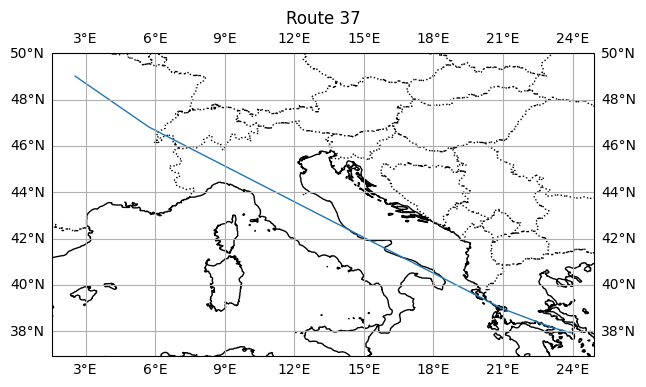

Route 38/100: LGAV -> XORKI -> GERMI -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.887,25.460,-24.845,False,1.0,6.336,3.512,0.057,-0.002,0.012,0.057,-0.011,0.041,-0.010,0.088,0.078
1,XORKI,GERMI,560,229,18.162,25.460,-29.059,False,1.0,4.624,2.589,0.057,-0.002,0.012,0.057,-0.008,0.030,0.106,0.080,0.186
2,GERMI,LFPG,229,95,1100.755,73.318,-33.691,False,1.0,807.055,158.645,0.057,-0.002,0.012,0.057,-1.346,1.841,0.094,0.553,0.647


Totals: bias=0.172, ac_dist=-1.364, time=1.912, preference=0.190, total=0.910


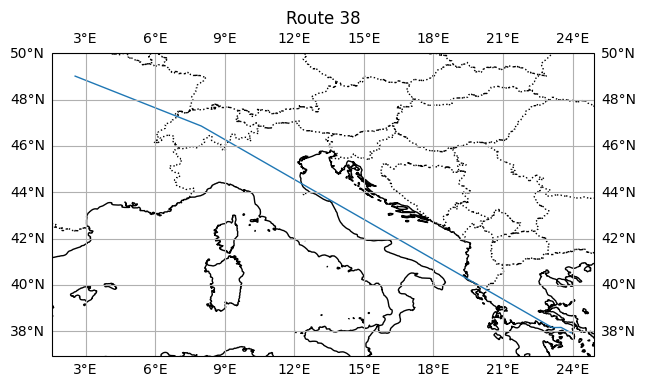

Route 39/100: LGAV -> LGKN -> GERMI_00 -> XANIS -> LGKR -> IVLOX_46 -> MONEB -> GIVRI -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI_00,200,492,41.647,25.460,-20.162,False,1.0,10.603,5.813,0.057,-0.002,0.012,0.057,-0.018,0.067,0.041,0.107,0.148
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
4,LGKR,IVLOX_46,270,87,519.588,70.317,-54.833,False,1.0,365.360,78.891,0.057,-0.002,0.012,0.057,-0.609,0.916,-0.051,0.364,0.313
5,IVLOX_46,MONEB,87,32,43.587,75.050,-48.545,False,1.0,32.712,6.514,0.057,-0.002,0.012,0.057,-0.055,0.076,-0.051,0.079,0.028
6,MONEB,GIVRI,32,109,228.470,95.885,-38.573,False,1.0,219.067,33.319,0.057,-0.002,0.012,0.057,-0.365,0.387,-0.050,0.079,0.028
7,GIVRI,OKIPA,109,232,106.723,80.073,0.000,True,1.0,85.457,14.230,0.057,-0.002,0.012,0.057,-0.143,0.165,-0.050,0.080,0.030
8,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.517, ac_dist=-1.331, time=2.017, preference=-0.290, total=0.913


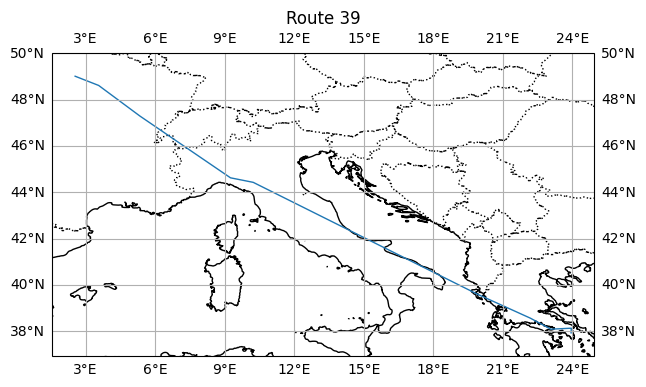

Route 40/100: LGAV -> LGKN -> RIMAX -> UNKIR -> LFQB -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,RIMAX,200,230,58.380,25.460,-22.538,False,1.0,14.863,8.194,0.057,-0.002,0.012,0.057,-0.025,0.095,-0.078,0.128,0.050
2,RIMAX,UNKIR,230,349,912.782,69.075,-50.730,False,1.0,630.502,137.168,0.057,-0.002,0.012,0.057,-1.051,1.592,0.032,0.598,0.631
3,UNKIR,LFQB,349,79,113.912,80.073,-25.213,False,1.0,91.212,16.090,0.057,-0.002,0.012,0.057,-0.152,0.187,0.011,0.092,0.103
4,LFQB,LFPG,79,95,71.408,80.070,-12.790,False,1.0,57.176,9.800,0.057,-0.002,0.012,0.057,-0.095,0.114,-0.005,0.076,0.071


Totals: bias=0.287, ac_dist=-1.329, time=2.007, preference=-0.051, total=0.914


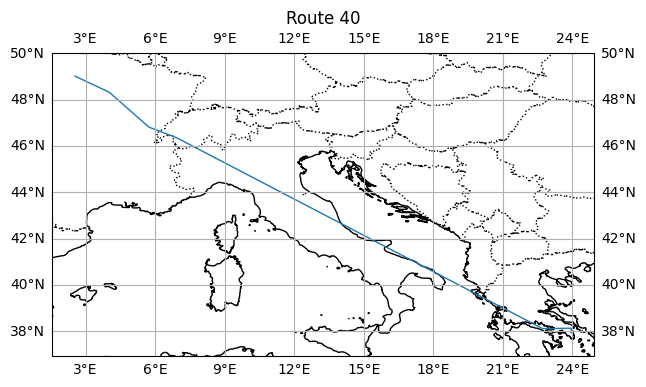

Route 41/100: LGAV -> LGKN -> GERMI -> PIKEL -> LSTR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,PIKEL,229,5,329.817,41.459,-64.213,False,1.0,136.741,51.295,0.057,-0.002,0.012,0.057,-0.228,0.595,-0.023,0.425,0.402
3,PIKEL,LSTR,5,272,566.690,84.286,-50.471,False,1.0,477.641,85.104,0.057,-0.002,0.012,0.057,-0.797,0.988,-0.023,0.249,0.226
4,LSTR,LFPG,272,95,212.660,83.196,-19.330,False,1.0,176.925,29.627,0.057,-0.002,0.012,0.057,-0.295,0.344,0.057,0.106,0.163


Totals: bias=0.287, ac_dist=-1.341, time=2.010, preference=-0.036, total=0.920


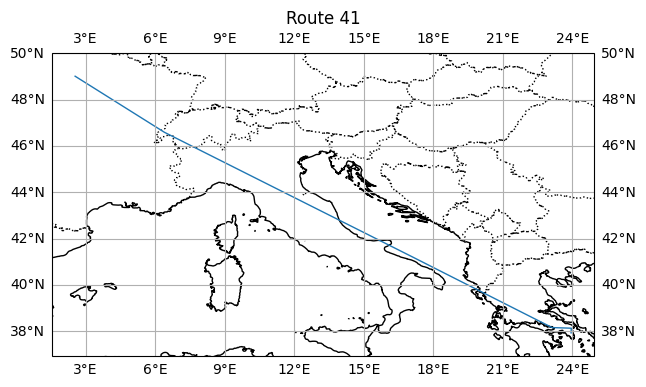

Route 42/100: LGAV -> LGKN -> IXONI -> GOLAS -> UNKIR -> LFQB -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,IXONI,200,148,81.838,25.460,-30.841,False,1.0,20.836,11.715,0.057,-0.002,0.012,0.057,-0.035,0.136,-0.054,0.159,0.105
2,IXONI,GOLAS,148,413,676.182,62.115,-53.960,False,1.0,420.012,102.442,0.057,-0.002,0.012,0.057,-0.700,1.189,-0.027,0.546,0.519
3,GOLAS,UNKIR,413,349,216.203,92.441,-43.075,False,1.0,199.860,31.879,0.057,-0.002,0.012,0.057,-0.333,0.370,-0.027,0.094,0.067
4,UNKIR,LFQB,349,79,113.912,80.073,-25.213,False,1.0,91.212,16.090,0.057,-0.002,0.012,0.057,-0.152,0.187,0.011,0.092,0.103
5,LFQB,LFPG,79,95,71.408,80.070,-12.790,False,1.0,57.176,9.800,0.057,-0.002,0.012,0.057,-0.095,0.114,-0.005,0.076,0.071


Totals: bias=0.345, ac_dist=-1.321, time=2.014, preference=-0.115, total=0.923


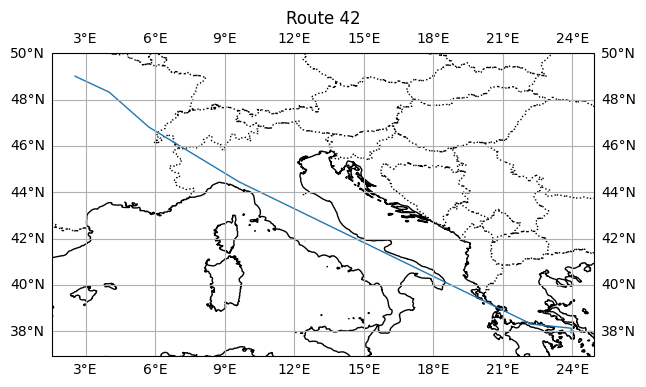

Route 43/100: LGAV -> LGKN -> RIMAX -> FASAN_32 -> URQAP -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,RIMAX,200,230,58.380,25.460,-22.538,False,1.0,14.863,8.194,0.057,-0.002,0.012,0.057,-0.025,0.095,-0.078,0.128,0.050
2,RIMAX,FASAN_32,230,42,291.639,41.179,-59.701,False,1.0,120.095,44.833,0.057,-0.002,0.012,0.057,-0.200,0.520,-0.021,0.378,0.356
3,FASAN_32,URQAP,42,96,639.477,83.688,-45.203,False,1.0,535.166,94.785,0.057,-0.002,0.012,0.057,-0.892,1.100,-0.021,0.265,0.244
4,URQAP,LFPG,96,95,169.310,80.077,-17.090,False,1.0,135.579,23.466,0.057,-0.002,0.012,0.057,-0.226,0.272,0.111,0.104,0.215


Totals: bias=0.287, ac_dist=-1.349, time=2.007, preference=-0.022, total=0.924


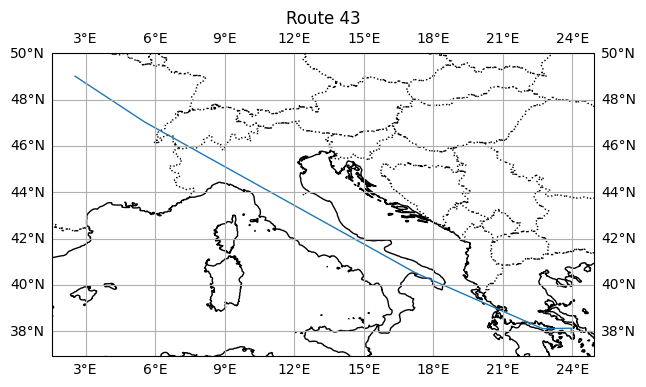

Route 44/100: LGAV -> LGKN -> GERMI -> LSTR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,LSTR,229,272,894.876,68.633,-52.642,False,1.0,614.176,135.124,0.057,-0.002,0.012,0.057,-1.024,1.568,0.033,0.602,0.634
3,LSTR,LFPG,272,95,212.660,83.196,-19.330,False,1.0,176.925,29.627,0.057,-0.002,0.012,0.057,-0.295,0.344,0.057,0.106,0.163


Totals: bias=0.230, ac_dist=-1.341, time=1.995, preference=0.042, total=0.926


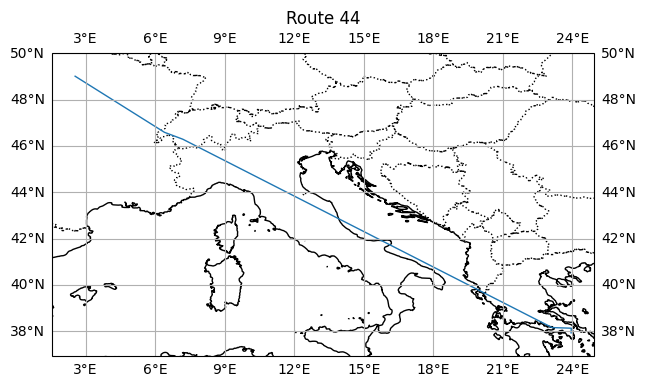

Route 45/100: LGAV -> LGKN -> GERMI -> LUMAR_43 -> LISKO -> LISMO -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,LUMAR_43,229,125,329.144,44.937,-65.964,False,1.0,147.909,51.424,0.057,-0.002,0.012,0.057,-0.247,0.597,-0.017,0.408,0.391
3,LUMAR_43,LISKO,125,459,193.821,75.051,-55.057,False,1.0,145.464,29.445,0.057,-0.002,0.012,0.057,-0.243,0.342,-0.017,0.157,0.140
4,LISKO,LISMO,459,403,404.736,94.019,-48.669,False,1.0,380.530,60.509,0.057,-0.002,0.012,0.057,-0.635,0.702,-0.000,0.125,0.125
5,LISMO,URELO,403,221,129.863,80.074,-25.380,False,1.0,103.987,18.350,0.057,-0.002,0.012,0.057,-0.173,0.213,0.002,0.097,0.099
6,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.402, ac_dist=-1.392, time=2.024, preference=-0.108, total=0.926


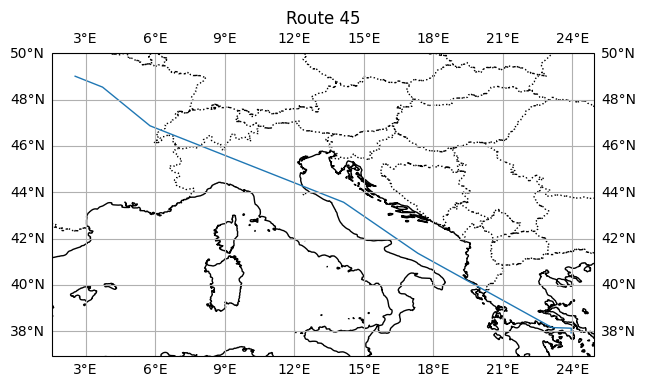

Route 46/100: LGAV -> LGTT -> PIKAD -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGTT,174,557,12.831,25.460,-24.299,False,1.0,3.267,1.809,0.057,-0.002,0.012,0.057,-0.005,0.021,0.040,0.073,0.113
1,LGTT,PIKAD,557,389,51.379,25.460,-29.718,False,1.0,13.081,7.335,0.057,-0.002,0.012,0.057,-0.022,0.085,0.108,0.121,0.229
2,PIKAD,LFPG,389,95,1090.344,73.706,-32.841,False,1.0,803.653,156.824,0.057,-0.002,0.012,0.057,-1.340,1.820,0.050,0.538,0.587


Totals: bias=0.172, ac_dist=-1.368, time=1.926, preference=0.198, total=0.929


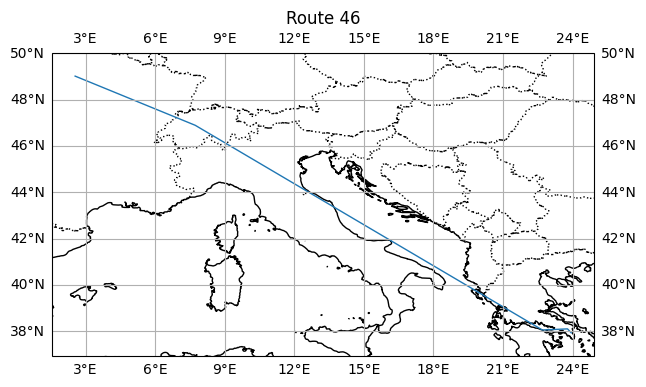

Route 47/100: LGAV -> GERMI_00 -> XANIS -> LGKR -> LERDU -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI_00,174,492,42.322,25.460,-22.223,False,1.0,10.775,5.936,0.057,-0.002,0.012,0.057,-0.018,0.069,0.160,0.108,0.269
1,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
2,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
3,LGKR,LERDU,270,52,752.241,79.147,-52.517,False,1.0,595.376,113.551,0.057,-0.002,0.012,0.057,-0.993,1.318,-0.052,0.383,0.331
4,LERDU,URELO,52,221,132.547,80.075,-25.576,False,1.0,106.136,18.738,0.057,-0.002,0.012,0.057,-0.177,0.217,-0.052,0.098,0.046
5,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.345, ac_dist=-1.335, time=2.004, preference=-0.085, total=0.930


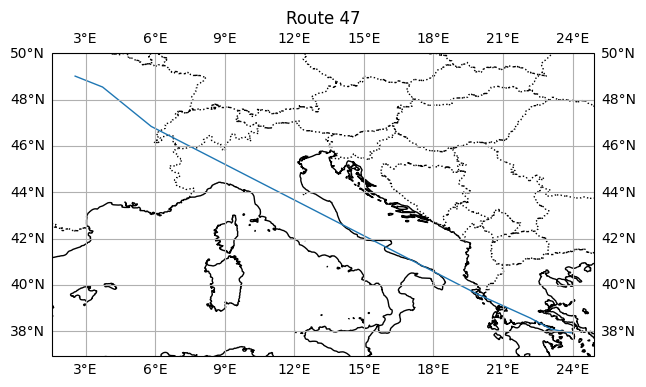

Route 48/100: LGAV -> GERMI -> KRK -> LSTR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,LSTR,234,272,736.105,77.748,-53.360,False,1.0,572.309,111.351,0.057,-0.002,0.012,0.057,-0.954,1.292,0.066,0.396,0.461
3,LSTR,URELO,272,221,159.275,84.336,-28.337,False,1.0,134.326,22.664,0.057,-0.002,0.012,0.057,-0.224,0.263,-0.038,0.097,0.058
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.338, time=2.001, preference=-0.012, total=0.939


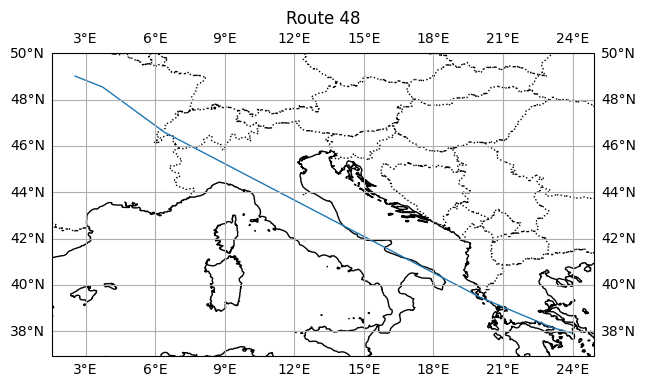

Route 49/100: LGAV -> GERMI -> PIKEL -> LSTR -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,PIKEL,229,5,329.817,41.459,-64.213,False,1.0,136.741,51.295,0.057,-0.002,0.012,0.057,-0.228,0.595,-0.023,0.425,0.402
2,PIKEL,LSTR,5,272,566.690,84.286,-50.471,False,1.0,477.641,85.104,0.057,-0.002,0.012,0.057,-0.797,0.988,-0.023,0.249,0.226
3,LSTR,OKIPA,272,232,167.059,84.145,-27.868,False,1.0,140.572,23.745,0.057,-0.002,0.012,0.057,-0.234,0.276,0.052,0.099,0.151
4,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.287, ac_dist=-1.339, time=2.000, preference=-0.007, total=0.941


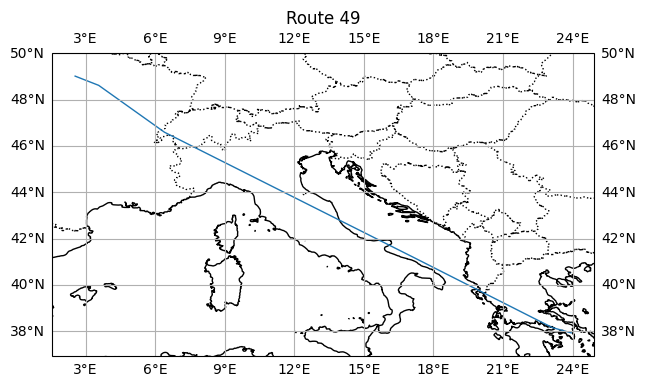

Route 50/100: LGAV -> LGKN -> GERMI -> GARTA -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,GARTA,229,361,112.527,25.460,-61.094,False,1.0,28.649,17.361,0.057,-0.002,0.012,0.057,-0.048,0.202,0.022,0.211,0.233
3,GARTA,UNKIR,361,349,816.494,74.245,-51.612,False,1.0,606.204,122.970,0.057,-0.002,0.012,0.057,-1.011,1.427,0.022,0.474,0.496
4,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.287, ac_dist=-1.326, time=2.007, preference=-0.027, total=0.942


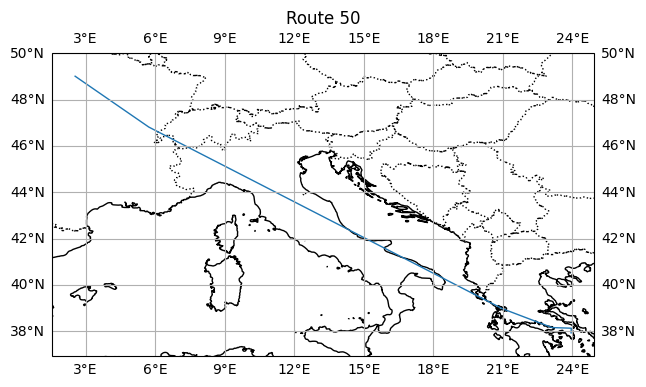

Route 51/100: LGAV -> GERMI -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.46,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,OKIPA,229,232,1054.036,73.15,-46.962,False,1.0,771.024,156.913,0.057,-0.002,0.012,0.057,-1.286,1.821,0.190,0.593,0.782
2,OKIPA,LFPG,232,95,46.745,80.07,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.172, ac_dist=-1.366, time=1.963, preference=0.175, total=0.945


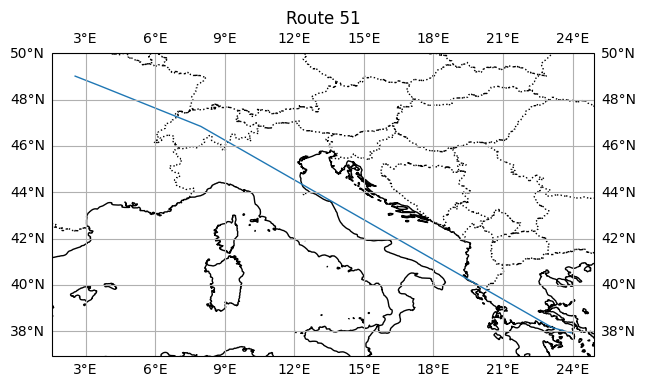

Route 52/100: LGAV -> LGMG -> GERMI_00 -> XANIS -> ENOXA -> LFGX -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGMG,174,124,27.511,25.460,-8.654,False,1.0,7.004,3.740,0.057,-0.002,0.012,0.057,-0.012,0.043,-0.024,0.089,0.065
1,LGMG,GERMI_00,124,492,15.473,25.460,-42.629,False,1.0,3.939,2.279,0.057,-0.002,0.012,0.057,-0.007,0.026,-0.032,0.077,0.045
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,ENOXA,319,187,261.131,46.389,-65.726,False,1.0,121.135,40.773,0.057,-0.002,0.012,0.057,-0.202,0.473,-0.018,0.329,0.311
4,ENOXA,LFGX,187,204,610.196,82.940,-50.596,False,1.0,506.096,91.666,0.057,-0.002,0.012,0.057,-0.844,1.064,-0.019,0.277,0.259
5,LFGX,OKIPA,204,232,143.606,80.075,-24.946,False,1.0,114.993,20.271,0.057,-0.002,0.012,0.057,-0.192,0.235,0.008,0.101,0.109
6,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.402, ac_dist=-1.340, time=2.008, preference=-0.125, total=0.945


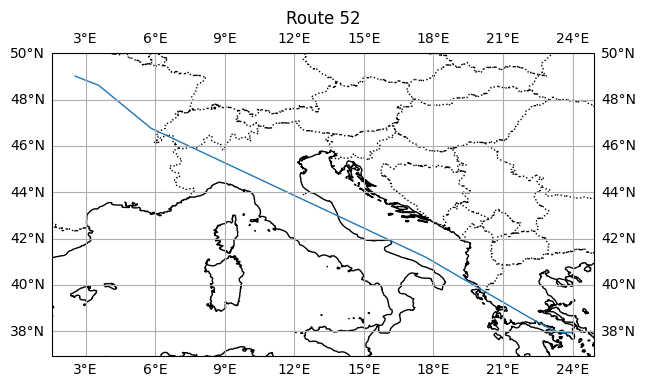

Route 53/100: LGAV -> LGKN -> IXONI -> SIROD -> CLM -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,IXONI,200,148,81.838,25.460,-30.841,False,1.0,20.836,11.715,0.057,-0.002,0.012,0.057,-0.035,0.136,-0.054,0.159,0.105
2,IXONI,SIROD,148,114,874.626,70.655,-50.723,False,1.0,617.967,131.431,0.057,-0.002,0.012,0.057,-1.031,1.526,0.017,0.552,0.569
3,SIROD,CLM,114,246,175.665,80.079,-22.197,False,1.0,140.670,24.637,0.057,-0.002,0.012,0.057,-0.235,0.286,0.021,0.109,0.130
4,CLM,LFPG,246,95,20.887,80.070,-3.739,False,1.0,16.724,2.808,0.057,-0.002,0.012,0.057,-0.028,0.033,0.021,0.062,0.083


Totals: bias=0.287, ac_dist=-1.333, time=1.999, preference=-0.008, total=0.946


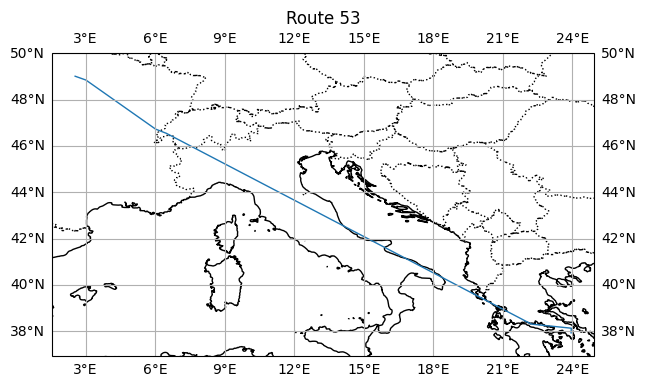

Route 54/100: LGAV -> XORKI -> XANIS -> ENOXA -> AIOSA -> LSTR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.887,25.460,-24.845,False,1.0,6.336,3.512,0.057,-0.002,0.012,0.057,-0.011,0.041,-0.010,0.088,0.078
1,XORKI,XANIS,560,319,66.815,25.460,-53.696,False,1.0,17.011,10.116,0.057,-0.002,0.012,0.057,-0.028,0.117,0.028,0.147,0.175
2,XANIS,ENOXA,319,187,261.131,46.389,-65.726,False,1.0,121.135,40.773,0.057,-0.002,0.012,0.057,-0.202,0.473,-0.018,0.329,0.311
3,ENOXA,AIOSA,187,578,47.559,74.699,-55.640,False,1.0,35.526,7.236,0.057,-0.002,0.012,0.057,-0.059,0.084,-0.018,0.082,0.064
4,AIOSA,LSTR,578,272,543.278,85.873,-54.149,False,1.0,466.527,82.346,0.057,-0.002,0.012,0.057,-0.778,0.956,-0.018,0.235,0.218
5,LSTR,URELO,272,221,159.275,84.336,-28.337,False,1.0,134.326,22.664,0.057,-0.002,0.012,0.057,-0.224,0.263,-0.038,0.097,0.058
6,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.402, ac_dist=-1.375, time=2.021, preference=-0.101, total=0.947


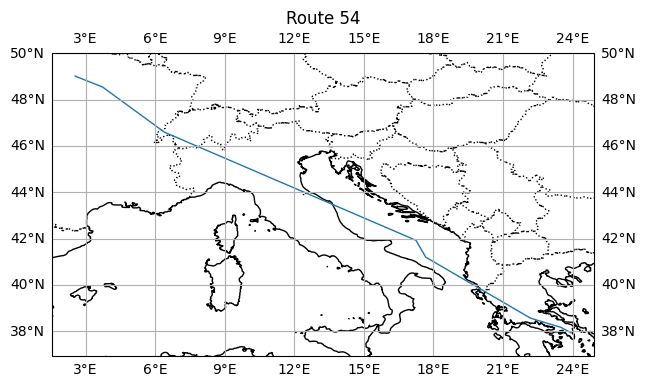

Route 55/100: LGAV -> LGKN -> PIKAD -> UNKIR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,PIKAD,200,389,59.477,25.460,-20.484,False,1.0,15.143,8.308,0.057,-0.002,0.012,0.057,-0.025,0.096,-0.015,0.129,0.114
2,PIKAD,UNKIR,389,349,914.319,69.095,-50.729,False,1.0,631.751,137.398,0.057,-0.002,0.012,0.057,-1.054,1.595,0.035,0.599,0.633
3,UNKIR,URELO,349,221,131.173,80.074,-24.805,False,1.0,105.036,18.510,0.057,-0.002,0.012,0.057,-0.175,0.215,0.003,0.097,0.100
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.332, time=2.012, preference=-0.017, total=0.950


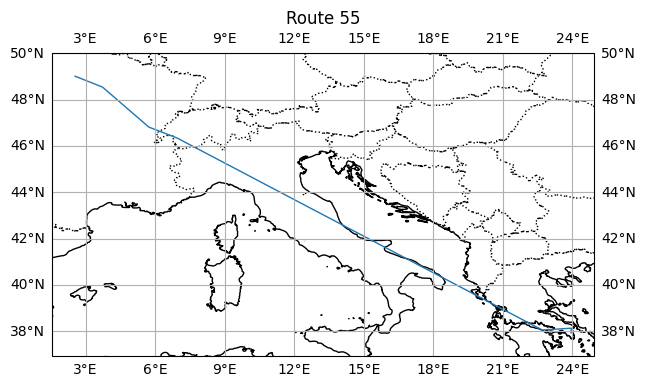

Route 56/100: LGAV -> LGMG -> GERMI_00 -> XANIS -> PIKOS_78 -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGMG,174,124,27.511,25.460,-8.654,False,1.0,7.004,3.740,0.057,-0.002,0.012,0.057,-0.012,0.043,-0.024,0.089,0.065
1,LGMG,GERMI_00,124,492,15.473,25.460,-42.629,False,1.0,3.939,2.279,0.057,-0.002,0.012,0.057,-0.007,0.026,-0.032,0.077,0.045
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,PIKOS_78,319,436,72.183,25.460,-71.279,False,1.0,18.378,11.436,0.057,-0.002,0.012,0.057,-0.031,0.133,0.451,0.160,0.610
4,PIKOS_78,LFPG,436,95,981.815,79.438,-34.341,False,1.0,779.932,141.724,0.057,-0.002,0.012,0.057,-1.301,1.645,-0.258,0.402,0.143


Totals: bias=0.287, ac_dist=-1.371, time=1.939, preference=0.100, total=0.955


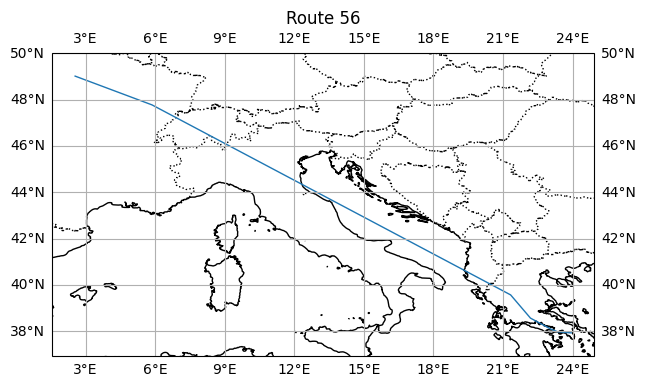

Route 57/100: LGAV -> GERMI -> KRK -> ARBOS_89 -> LFQB -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,ARBOS_89,234,44,749.897,76.281,-53.294,False,1.0,572.029,113.419,0.057,-0.002,0.012,0.057,-0.954,1.316,0.028,0.420,0.448
3,ARBOS_89,LFQB,44,79,131.814,80.074,-26.545,False,1.0,105.549,18.677,0.057,-0.002,0.012,0.057,-0.176,0.217,-0.037,0.098,0.061
4,LFQB,LFPG,79,95,71.408,80.070,-12.790,False,1.0,57.176,9.800,0.057,-0.002,0.012,0.057,-0.095,0.114,-0.005,0.076,0.071


Totals: bias=0.287, ac_dist=-1.312, time=2.006, preference=-0.026, total=0.956


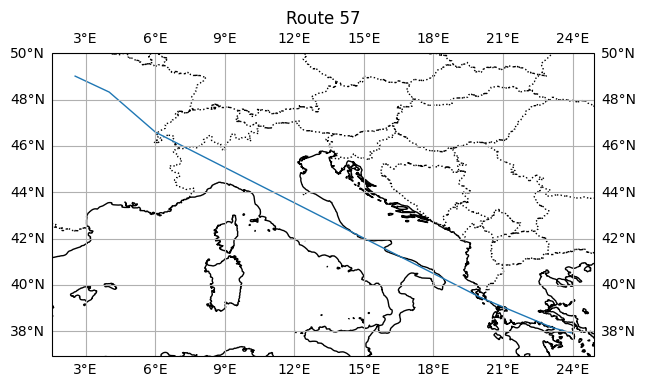

Route 58/100: LGAV -> XORKI -> GERMI -> ODNUP -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.887,25.460,-24.845,False,1.0,6.336,3.512,0.057,-0.002,0.012,0.057,-0.011,0.041,-0.010,0.088,0.078
1,XORKI,GERMI,560,229,18.162,25.460,-29.059,False,1.0,4.624,2.589,0.057,-0.002,0.012,0.057,-0.008,0.030,0.106,0.080,0.186
2,GERMI,ODNUP,229,244,872.220,64.667,-55.292,False,1.0,564.041,132.587,0.057,-0.002,0.012,0.057,-0.941,1.539,-0.048,0.656,0.608
3,ODNUP,URELO,244,221,185.902,87.538,-30.218,False,1.0,162.736,26.571,0.057,-0.002,0.012,0.057,-0.271,0.308,-0.048,0.094,0.047
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.303, time=2.005, preference=-0.027, total=0.962


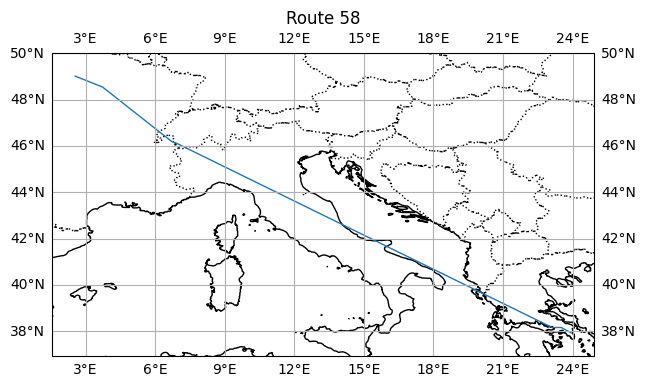

Route 59/100: LGAV -> GERMI -> IDREK_06 -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,IDREK_06,229,409,711.226,61.065,-57.711,False,1.0,434.312,108.781,0.057,-0.002,0.012,0.057,-0.724,1.263,0.356,0.596,0.952
2,IDREK_06,LFPG,409,95,390.046,103.020,-23.689,False,1.0,401.824,54.896,0.057,-0.002,0.012,0.057,-0.670,0.637,-0.111,0.025,-0.086


Totals: bias=0.172, ac_dist=-1.412, time=1.967, preference=0.235, total=0.963


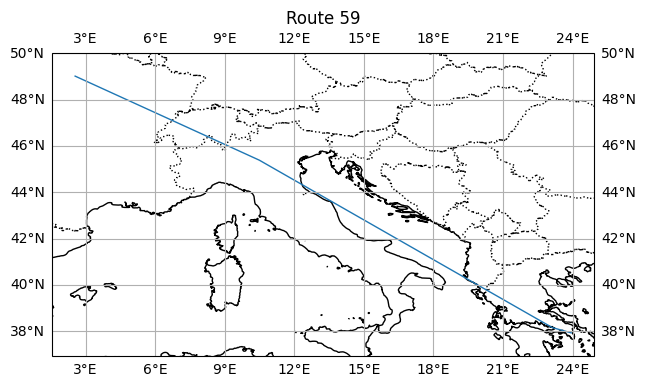

Route 60/100: LGAV -> GERMI -> KRK -> ABADI -> SIROD -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,ABADI,234,579,102.562,38.522,-69.485,False,1.0,39.508,16.172,0.057,-0.002,0.012,0.057,-0.066,0.188,-0.016,0.179,0.164
3,ABADI,SIROD,579,114,653.247,83.769,-52.572,False,1.0,547.221,98.621,0.057,-0.002,0.012,0.057,-0.913,1.145,0.004,0.290,0.293
4,SIROD,OKIPA,114,232,150.517,80.076,-25.926,False,1.0,120.528,21.296,0.057,-0.002,0.012,0.057,-0.201,0.247,-0.037,0.104,0.066
5,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.345, ac_dist=-1.328, time=2.013, preference=-0.065, total=0.965


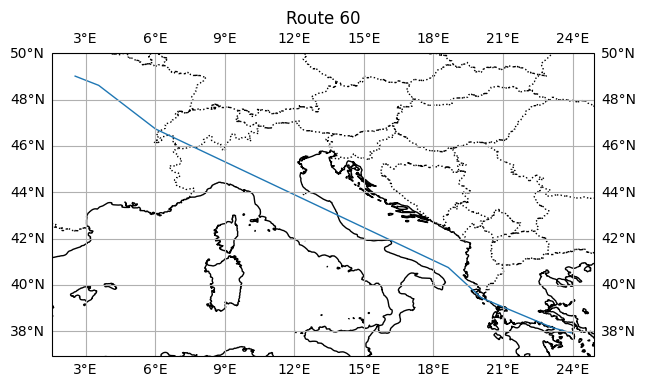

Route 61/100: LGAV -> LGKN -> GERMI -> LGKR -> KONIL -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,LGKR,229,270,173.120,25.460,-64.068,False,1.0,44.076,26.915,0.057,-0.002,0.012,0.057,-0.074,0.312,0.028,0.296,0.324
3,LGKR,KONIL,270,238,721.589,78.352,-53.647,False,1.0,565.380,109.234,0.057,-0.002,0.012,0.057,-0.943,1.268,-0.015,0.383,0.368
4,KONIL,OKIPA,238,232,169.638,85.401,-28.157,False,1.0,144.873,24.128,0.057,-0.002,0.012,0.057,-0.242,0.280,-0.015,0.096,0.081
5,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.345, ac_dist=-1.342, time=2.017, preference=-0.053, total=0.967


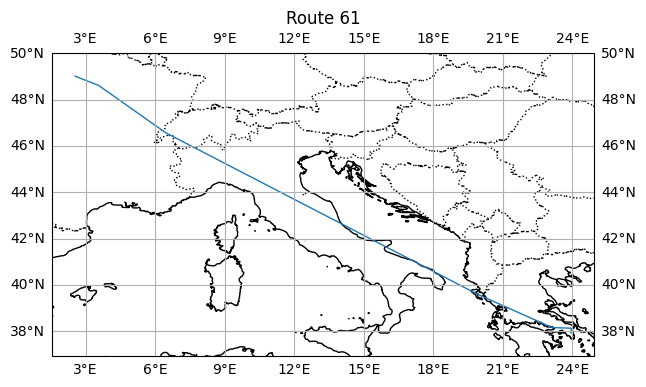

Route 62/100: LGAV -> GERMI -> NIKOL -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,NIKOL,229,580,559.753,43.015,-65.147,False,1.0,240.780,87.268,0.057,-0.002,0.012,0.057,-0.402,1.013,0.001,0.669,0.670
2,NIKOL,UNKIR,580,349,369.043,96.097,-51.764,False,1.0,354.637,55.602,0.057,-0.002,0.012,0.057,-0.591,0.645,0.005,0.111,0.117
3,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.230, ac_dist=-1.256, time=2.021, preference=-0.027, total=0.968


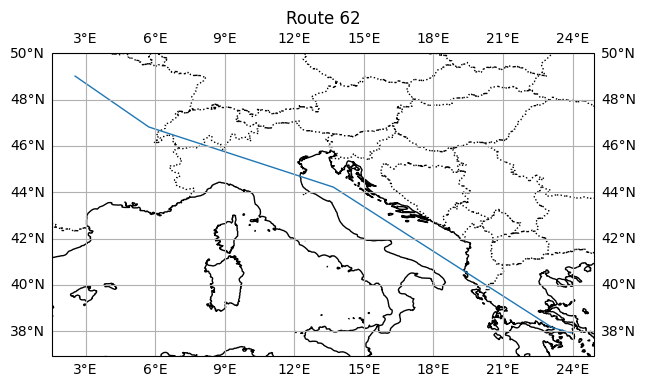

Route 63/100: LGAV -> GERMI_00 -> XANIS -> LGKR -> IVLOX_46 -> MONEB -> GIVRI -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI_00,174,492,42.322,25.460,-22.223,False,1.0,10.775,5.936,0.057,-0.002,0.012,0.057,-0.018,0.069,0.160,0.108,0.269
1,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
2,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
3,LGKR,IVLOX_46,270,87,519.588,70.317,-54.833,False,1.0,365.360,78.891,0.057,-0.002,0.012,0.057,-0.609,0.916,-0.051,0.364,0.313
4,IVLOX_46,MONEB,87,32,43.587,75.050,-48.545,False,1.0,32.712,6.514,0.057,-0.002,0.012,0.057,-0.055,0.076,-0.051,0.079,0.028
5,MONEB,GIVRI,32,109,228.470,95.885,-38.573,False,1.0,219.067,33.319,0.057,-0.002,0.012,0.057,-0.365,0.387,-0.050,0.079,0.028
6,GIVRI,OKIPA,109,232,106.723,80.073,0.000,True,1.0,85.457,14.230,0.057,-0.002,0.012,0.057,-0.143,0.165,-0.050,0.080,0.030
7,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.460, ac_dist=-1.326, time=1.999, preference=-0.159, total=0.974


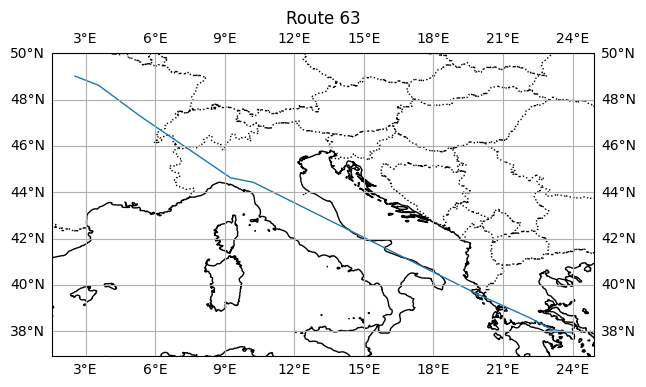

Route 64/100: LGAV -> GERMI -> IXONI -> GOLAS -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,IXONI,229,148,43.021,25.460,-47.639,False,1.0,10.953,6.415,0.057,-0.002,0.012,0.057,-0.018,0.074,0.097,0.114,0.210
2,IXONI,GOLAS,148,413,676.182,62.115,-53.960,False,1.0,420.012,102.442,0.057,-0.002,0.012,0.057,-0.700,1.189,-0.027,0.546,0.519
3,GOLAS,UNKIR,413,349,216.203,92.441,-43.075,False,1.0,199.860,31.879,0.057,-0.002,0.012,0.057,-0.333,0.370,-0.027,0.094,0.067
4,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.287, ac_dist=-1.315, time=1.996, preference=0.008, total=0.977


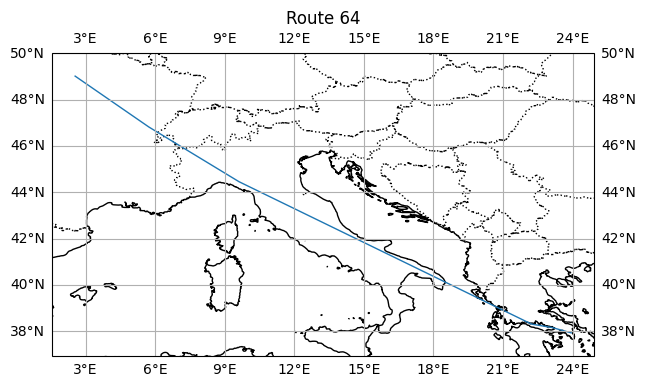

Route 65/100: LGAV -> LGKN -> PIKAD -> BANKO -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,PIKAD,200,389,59.477,25.460,-20.484,False,1.0,15.143,8.308,0.057,-0.002,0.012,0.057,-0.025,0.096,-0.015,0.129,0.114
2,PIKAD,BANKO,389,591,837.354,63.094,-56.224,False,1.0,528.321,127.588,0.057,-0.002,0.012,0.057,-0.881,1.481,-0.004,0.657,0.654
3,BANKO,UNKIR,591,349,81.265,91.558,-41.019,False,1.0,74.405,11.922,0.057,-0.002,0.012,0.057,-0.124,0.138,-0.004,0.072,0.068
4,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.287, ac_dist=-1.281, time=2.030, preference=-0.057, total=0.980


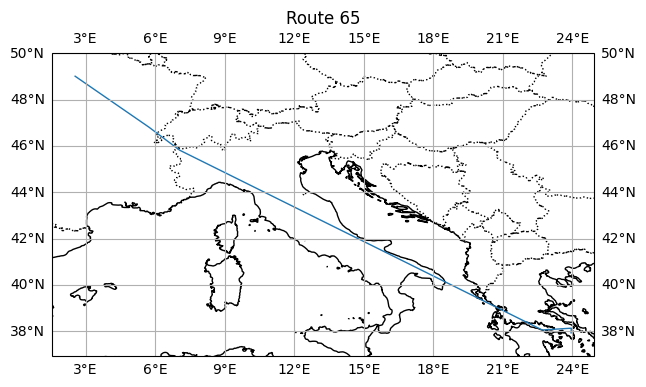

Route 66/100: LGAV -> XORKI -> GERMI -> LUKID -> LFFH -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.887,25.460,-24.845,False,1.0,6.336,3.512,0.057,-0.002,0.012,0.057,-0.011,0.041,-0.010,0.088,0.078
1,XORKI,GERMI,560,229,18.162,25.460,-29.059,False,1.0,4.624,2.589,0.057,-0.002,0.012,0.057,-0.008,0.030,0.106,0.080,0.186
2,GERMI,LUKID,229,147,930.687,66.326,-51.267,False,1.0,617.289,140.047,0.057,-0.002,0.012,0.057,-1.029,1.626,-0.071,0.654,0.583
3,LUKID,LFFH,147,84,164.826,80.076,-21.372,False,1.0,131.986,23.073,0.057,-0.002,0.012,0.057,-0.220,0.268,-0.071,0.105,0.034
4,LFFH,LFPG,84,95,31.977,80.070,-3.868,False,1.0,25.604,4.301,0.057,-0.002,0.012,0.057,-0.043,0.050,0.040,0.065,0.105


Totals: bias=0.287, ac_dist=-1.311, time=2.014, preference=-0.005, total=0.986


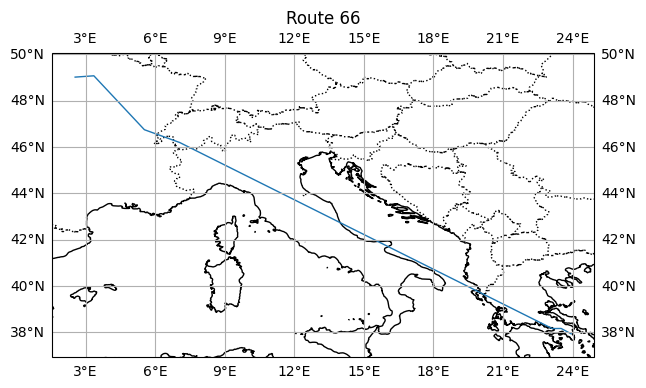

Route 67/100: LGAV -> GERMI -> KRK -> ARBOS_89 -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,ARBOS_89,234,44,749.897,76.281,-53.294,False,1.0,572.029,113.419,0.057,-0.002,0.012,0.057,-0.954,1.316,0.028,0.420,0.448
3,ARBOS_89,LFPG,44,95,201.548,80.081,-18.319,False,1.0,161.402,28.013,0.057,-0.002,0.012,0.057,-0.269,0.325,0.050,0.113,0.164


Totals: bias=0.230, ac_dist=-1.309, time=2.001, preference=0.067, total=0.988


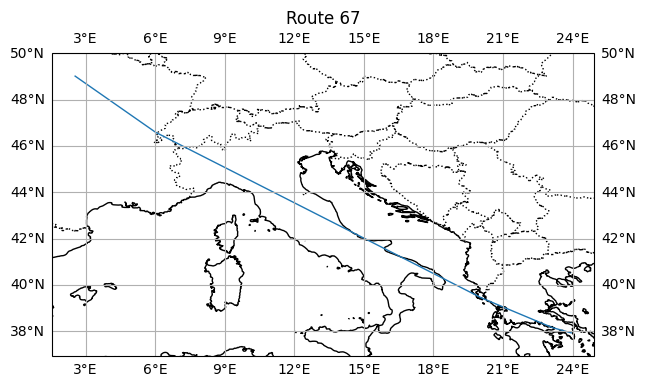

Route 68/100: LGAV -> XORKI -> GERMI -> OMIDO -> JAVVU -> NANOP -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.887,25.460,-24.845,False,1.0,6.336,3.512,0.057,-0.002,0.012,0.057,-0.011,0.041,-0.010,0.088,0.078
1,XORKI,GERMI,560,229,18.162,25.460,-29.059,False,1.0,4.624,2.589,0.057,-0.002,0.012,0.057,-0.008,0.030,0.106,0.080,0.186
2,GERMI,OMIDO,229,197,844.034,67.416,-52.792,False,1.0,569.016,127.495,0.057,-0.002,0.012,0.057,-0.949,1.480,-0.013,0.588,0.575
3,OMIDO,JAVVU,197,397,106.751,129.359,-42.867,False,1.0,138.092,15.732,0.057,-0.002,0.012,0.057,-0.230,0.183,-0.013,0.010,-0.003
4,JAVVU,NANOP,397,26,85.100,80.072,-28.517,False,1.0,68.141,12.114,0.057,-0.002,0.012,0.057,-0.114,0.141,-0.035,0.084,0.050
5,NANOP,LFPG,26,95,80.749,80.070,-13.435,False,1.0,64.656,11.098,0.057,-0.002,0.012,0.057,-0.108,0.129,0.026,0.078,0.105


Totals: bias=0.345, ac_dist=-1.419, time=2.003, preference=0.061, total=0.990


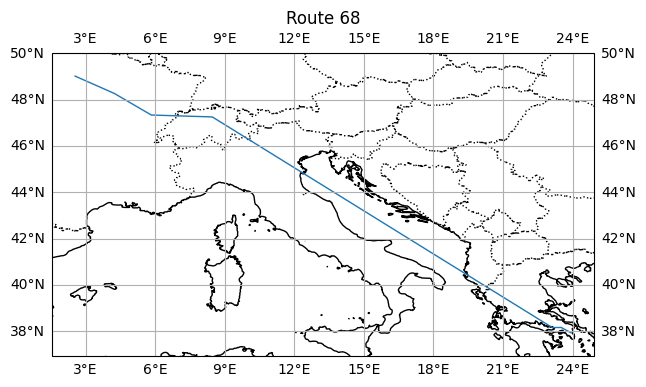

Route 69/100: LGAV -> GERMI -> KRK -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,UNKIR,234,349,766.872,77.393,-52.401,False,1.0,593.503,115.725,0.057,-0.002,0.012,0.057,-0.990,1.343,0.122,0.411,0.533
3,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.230, ac_dist=-1.321, time=1.998, preference=0.087, total=0.994


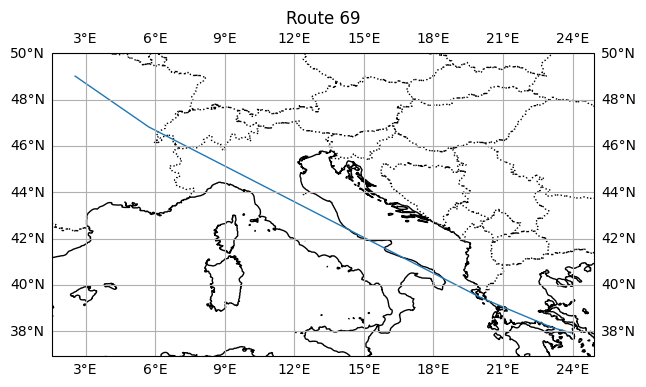

Route 70/100: LGAV -> GERMI -> AIOSA -> LSTR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,AIOSA,229,578,351.957,45.218,-68.744,False,1.0,159.148,55.389,0.057,-0.002,0.012,0.057,-0.265,0.643,0.143,0.435,0.578
2,AIOSA,LSTR,578,272,543.278,85.873,-54.149,False,1.0,466.527,82.346,0.057,-0.002,0.012,0.057,-0.778,0.956,-0.018,0.235,0.218
3,LSTR,URELO,272,221,159.275,84.336,-28.337,False,1.0,134.326,22.664,0.057,-0.002,0.012,0.057,-0.224,0.263,-0.038,0.097,0.058
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.358, time=2.016, preference=0.049, total=0.994


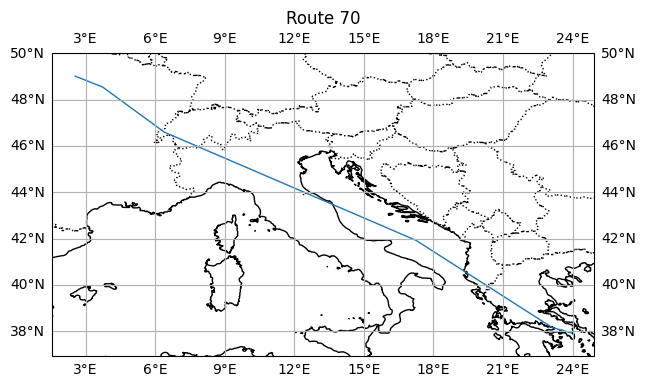

Route 71/100: LGAV -> LGKN -> PIKAD -> DINOX -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,PIKAD,200,389,59.477,25.460,-20.484,False,1.0,15.143,8.308,0.057,-0.002,0.012,0.057,-0.025,0.096,-0.015,0.129,0.114
2,PIKAD,DINOX,389,298,895.851,68.950,-51.552,False,1.0,617.686,134.901,0.057,-0.002,0.012,0.057,-1.030,1.566,0.029,0.593,0.623
3,DINOX,OKIPA,298,232,155.951,80.077,-26.398,False,1.0,124.880,22.089,0.057,-0.002,0.012,0.057,-0.208,0.256,0.031,0.106,0.137
4,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.287, ac_dist=-1.331, time=2.012, preference=0.030, total=0.998


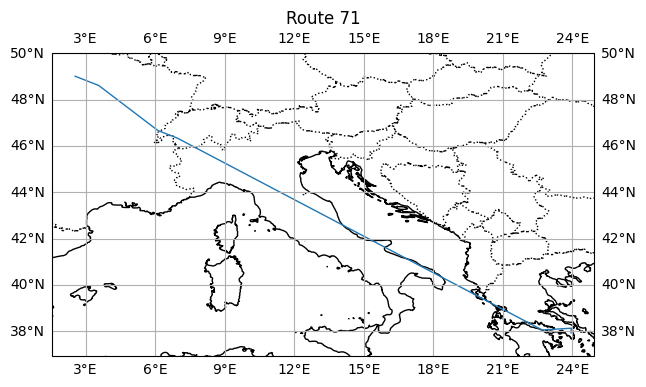

Route 72/100: LGAV -> ROPOX -> GERMI -> WEBCA -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,ROPOX,174,33,16.405,25.460,-10.927,False,1.0,4.177,2.242,0.057,-0.002,0.012,0.057,-0.007,0.026,0.046,0.077,0.123
1,ROPOX,GERMI,33,229,30.186,25.460,-23.520,False,1.0,7.685,4.247,0.057,-0.002,0.012,0.057,-0.013,0.049,0.075,0.094,0.169
2,GERMI,WEBCA,229,583,864.393,63.322,-55.991,False,1.0,547.352,131.631,0.057,-0.002,0.012,0.057,-0.913,1.528,-0.054,0.673,0.619
3,WEBCA,URELO,583,221,194.839,86.949,-30.786,False,1.0,169.410,27.886,0.057,-0.002,0.012,0.057,-0.283,0.324,-0.054,0.099,0.045
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.288, time=2.014, preference=-0.015, total=0.998


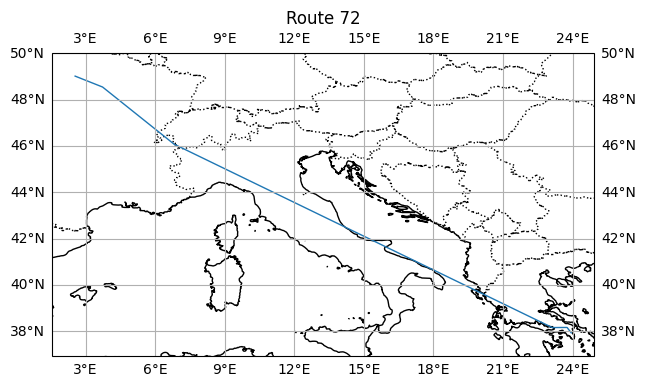

Route 73/100: LGAV -> LGKN -> RIMAX -> UMTEX_29 -> LUL_68 -> LFEV -> LANVI -> GELTA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,RIMAX,200,230,58.380,25.460,-22.538,False,1.0,14.863,8.194,0.057,-0.002,0.012,0.057,-0.025,0.095,-0.078,0.128,0.050
2,RIMAX,UMTEX_29,230,508,812.003,54.621,-53.665,False,1.0,443.525,122.927,0.057,-0.002,0.012,0.057,-0.740,1.427,-0.024,0.745,0.720
3,UMTEX_29,LUL_68,508,265,129.942,140.439,-42.551,False,1.0,182.488,19.135,0.057,-0.002,0.012,0.057,-0.304,0.222,-0.024,-0.025,-0.049
4,LUL_68,LFEV,265,35,22.498,80.070,-37.401,False,1.0,18.014,3.272,0.057,-0.002,0.012,0.057,-0.030,0.038,-0.024,0.065,0.041
5,LFEV,LANVI,35,81,45.533,80.070,-11.758,False,1.0,36.459,6.234,0.057,-0.002,0.012,0.057,-0.061,0.072,-0.024,0.069,0.045
6,LANVI,GELTA,81,219,61.082,80.070,-32.087,False,1.0,48.908,8.770,0.057,-0.002,0.012,0.057,-0.082,0.102,-0.024,0.078,0.053
7,GELTA,LFPG,219,95,65.767,80.070,-12.603,False,1.0,52.660,9.022,0.057,-0.002,0.012,0.057,-0.088,0.105,0.005,0.074,0.079


Totals: bias=0.460, ac_dist=-1.334, time=2.080, preference=-0.207, total=0.998


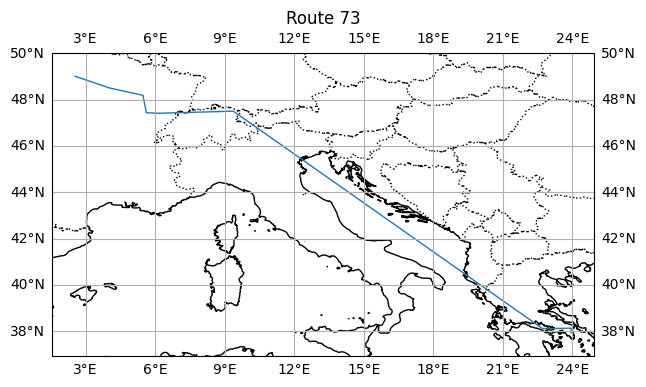

Route 74/100: LGAV -> RIMAX -> UNKIR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,RIMAX,174,230,59.075,25.460,-22.070,False,1.0,15.040,8.283,0.057,-0.002,0.012,0.057,-0.025,0.096,0.097,0.129,0.226
1,RIMAX,UNKIR,230,349,912.782,69.075,-50.730,False,1.0,630.502,137.168,0.057,-0.002,0.012,0.057,-1.051,1.592,0.032,0.598,0.631
2,UNKIR,URELO,349,221,131.173,80.074,-24.805,False,1.0,105.036,18.510,0.057,-0.002,0.012,0.057,-0.175,0.215,0.003,0.097,0.100
3,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.230, ac_dist=-1.325, time=1.990, preference=0.104, total=0.999


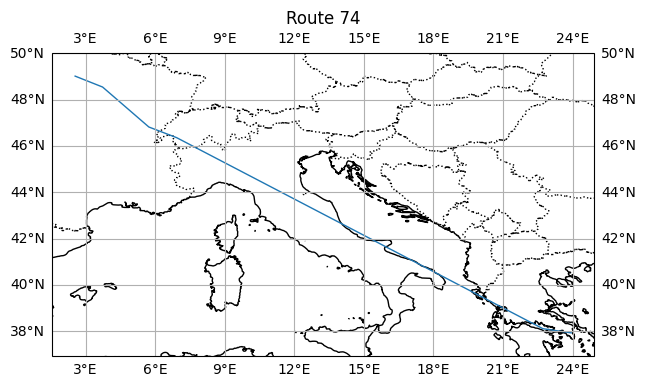

Route 75/100: LGAV -> XORKI -> XANIS -> ENOXA -> AIOSA -> LSTR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.887,25.460,-24.845,False,1.0,6.336,3.512,0.057,-0.002,0.012,0.057,-0.011,0.041,-0.010,0.088,0.078
1,XORKI,XANIS,560,319,66.815,25.460,-53.696,False,1.0,17.011,10.116,0.057,-0.002,0.012,0.057,-0.028,0.117,0.028,0.147,0.175
2,XANIS,ENOXA,319,187,261.131,46.389,-65.726,False,1.0,121.135,40.773,0.057,-0.002,0.012,0.057,-0.202,0.473,-0.018,0.329,0.311
3,ENOXA,AIOSA,187,578,47.559,74.699,-55.640,False,1.0,35.526,7.236,0.057,-0.002,0.012,0.057,-0.059,0.084,-0.018,0.082,0.064
4,AIOSA,LSTR,578,272,543.278,85.873,-54.149,False,1.0,466.527,82.346,0.057,-0.002,0.012,0.057,-0.778,0.956,-0.018,0.235,0.218
5,LSTR,LFPG,272,95,212.660,83.196,-19.330,False,1.0,176.925,29.627,0.057,-0.002,0.012,0.057,-0.295,0.344,0.057,0.106,0.163


Totals: bias=0.345, ac_dist=-1.373, time=2.015, preference=0.022, total=1.008


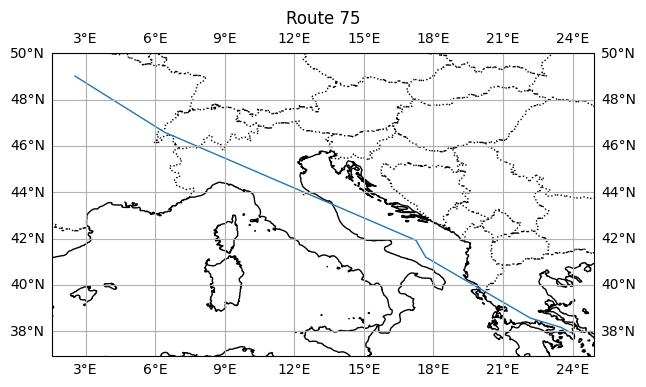

Route 76/100: LGAV -> GERMI -> KRK -> LISKO -> LISMO -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,LISKO,234,459,364.179,65.982,-61.934,False,1.0,240.293,56.307,0.057,-0.002,0.012,0.057,-0.401,0.654,0.055,0.310,0.365
3,LISKO,LISMO,459,403,404.736,94.019,-48.669,False,1.0,380.530,60.509,0.057,-0.002,0.012,0.057,-0.635,0.702,-0.000,0.125,0.125
4,LISMO,URELO,403,221,129.863,80.074,-25.380,False,1.0,103.987,18.350,0.057,-0.002,0.012,0.057,-0.173,0.213,0.002,0.097,0.099
5,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.345, ac_dist=-1.368, time=2.015, preference=0.017, total=1.009


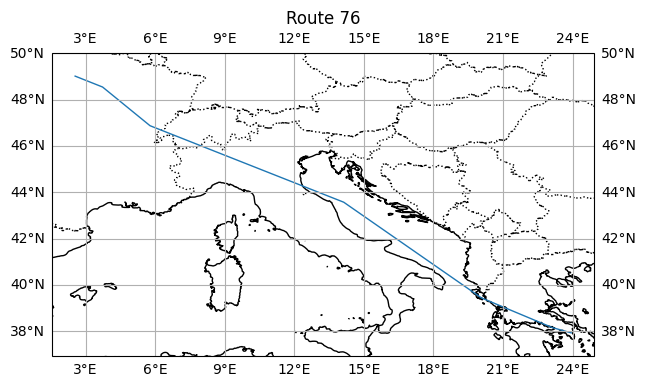

Route 77/100: LGAV -> LGKN -> GERMI -> KRK -> ARBOS_89 -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
3,KRK,ARBOS_89,234,44,749.897,76.281,-53.294,False,1.0,572.029,113.419,0.057,-0.002,0.012,0.057,-0.954,1.316,0.028,0.420,0.448
4,ARBOS_89,LFPG,44,95,201.548,80.081,-18.319,False,1.0,161.402,28.013,0.057,-0.002,0.012,0.057,-0.269,0.325,0.050,0.113,0.164


Totals: bias=0.287, ac_dist=-1.314, time=2.016, preference=0.030, total=1.019


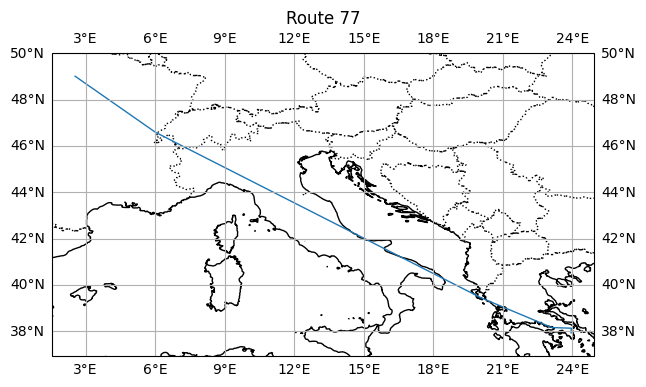

Route 78/100: LGAV -> LGKN -> LGTT -> PIKAD -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,LGTT,200,557,8.204,25.460,-11.366,False,1.0,2.089,1.122,0.057,-0.002,0.012,0.057,-0.003,0.013,0.078,0.067,0.145
2,LGTT,PIKAD,557,389,51.379,25.460,-29.718,False,1.0,13.081,7.335,0.057,-0.002,0.012,0.057,-0.022,0.085,0.108,0.121,0.229
3,PIKAD,LFPG,389,95,1090.344,73.706,-32.841,False,1.0,803.653,156.824,0.057,-0.002,0.012,0.057,-1.340,1.820,0.050,0.538,0.587


Totals: bias=0.230, ac_dist=-1.371, time=1.937, preference=0.224, total=1.021


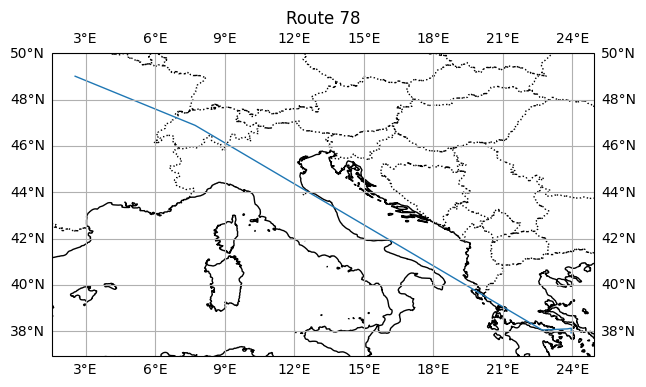

Route 79/100: LGAV -> ROPOX -> GERMI -> LSTR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,ROPOX,174,33,16.405,25.460,-10.927,False,1.0,4.177,2.242,0.057,-0.002,0.012,0.057,-0.007,0.026,0.046,0.077,0.123
1,ROPOX,GERMI,33,229,30.186,25.460,-23.520,False,1.0,7.685,4.247,0.057,-0.002,0.012,0.057,-0.013,0.049,0.075,0.094,0.169
2,GERMI,LSTR,229,272,894.876,68.633,-52.642,False,1.0,614.176,135.124,0.057,-0.002,0.012,0.057,-1.024,1.568,0.033,0.602,0.634
3,LSTR,URELO,272,221,159.275,84.336,-28.337,False,1.0,134.326,22.664,0.057,-0.002,0.012,0.057,-0.224,0.263,-0.038,0.097,0.058
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.341, time=1.994, preference=0.088, total=1.028


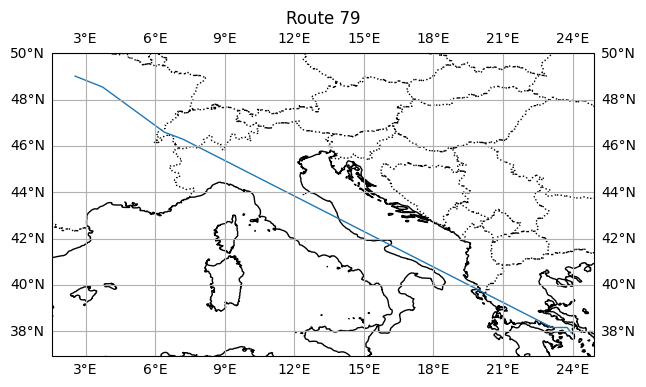

Route 80/100: LGAV -> LGKN -> GERMI -> LUMAR_43 -> LISKO -> DINOX -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,LUMAR_43,229,125,329.144,44.937,-65.964,False,1.0,147.909,51.424,0.057,-0.002,0.012,0.057,-0.247,0.597,-0.017,0.408,0.391
3,LUMAR_43,LISKO,125,459,193.821,75.051,-55.057,False,1.0,145.464,29.445,0.057,-0.002,0.012,0.057,-0.243,0.342,-0.017,0.157,0.140
4,LISKO,DINOX,459,298,386.737,92.780,-49.741,False,1.0,358.817,57.973,0.057,-0.002,0.012,0.057,-0.598,0.673,0.038,0.132,0.170
5,DINOX,OKIPA,298,232,155.951,80.077,-26.398,False,1.0,124.880,22.089,0.057,-0.002,0.012,0.057,-0.208,0.256,0.031,0.106,0.137
6,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.402, ac_dist=-1.380, time=2.025, preference=-0.016, total=1.031


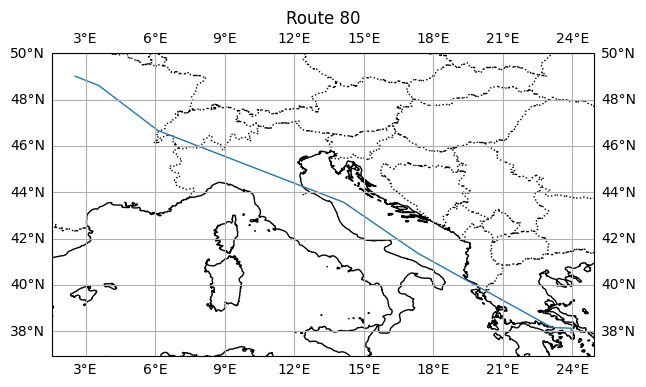

Route 81/100: LGAV -> RIMAX -> LIBV -> ARBOS_89 -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,RIMAX,174,230,59.075,25.460,-22.070,False,1.0,15.040,8.283,0.057,-0.002,0.012,0.057,-0.025,0.096,0.097,0.129,0.226
1,RIMAX,LIBV,230,593,311.687,43.029,-60.705,False,1.0,134.117,48.039,0.057,-0.002,0.012,0.057,-0.224,0.558,-0.015,0.391,0.377
2,LIBV,ARBOS_89,593,44,588.215,81.136,-47.859,False,1.0,477.254,87.763,0.057,-0.002,0.012,0.057,-0.796,1.019,-0.015,0.280,0.266
3,ARBOS_89,LFPG,44,95,201.548,80.081,-18.319,False,1.0,161.402,28.013,0.057,-0.002,0.012,0.057,-0.269,0.325,0.050,0.113,0.164


Totals: bias=0.230, ac_dist=-1.314, time=1.998, preference=0.118, total=1.032


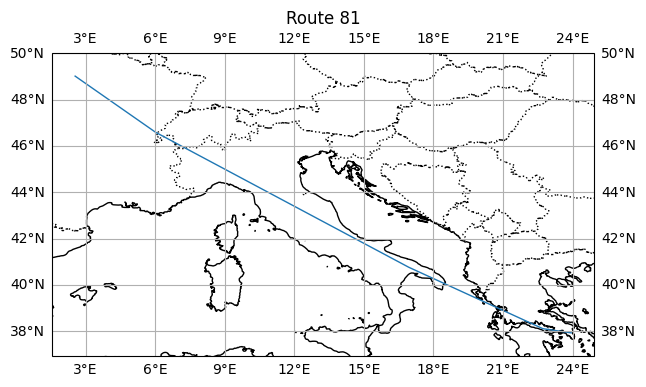

Route 82/100: LGAV -> LGKN -> GERMI -> KRK -> LSTR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
3,KRK,LSTR,234,272,736.105,77.748,-53.360,False,1.0,572.309,111.351,0.057,-0.002,0.012,0.057,-0.954,1.292,0.066,0.396,0.461
4,LSTR,LFPG,272,95,212.660,83.196,-19.330,False,1.0,176.925,29.627,0.057,-0.002,0.012,0.057,-0.295,0.344,0.057,0.106,0.163


Totals: bias=0.287, ac_dist=-1.340, time=2.011, preference=0.074, total=1.032


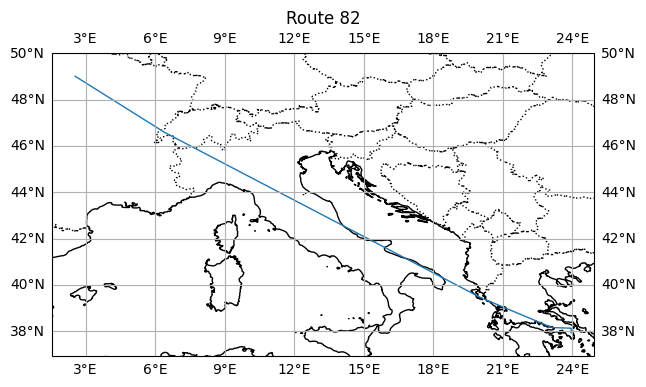

Route 83/100: LGAV -> ROPOX -> GERMI -> OMIDO -> JAVVU -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,ROPOX,174,33,16.405,25.460,-10.927,False,1.0,4.177,2.242,0.057,-0.002,0.012,0.057,-0.007,0.026,0.046,0.077,0.123
1,ROPOX,GERMI,33,229,30.186,25.460,-23.520,False,1.0,7.685,4.247,0.057,-0.002,0.012,0.057,-0.013,0.049,0.075,0.094,0.169
2,GERMI,OMIDO,229,197,844.034,67.416,-52.792,False,1.0,569.016,127.495,0.057,-0.002,0.012,0.057,-0.949,1.480,-0.013,0.588,0.575
3,OMIDO,JAVVU,197,397,106.751,129.359,-42.867,False,1.0,138.092,15.732,0.057,-0.002,0.012,0.057,-0.230,0.183,-0.013,0.010,-0.003
4,JAVVU,OKIPA,397,232,119.213,80.074,-27.145,False,1.0,95.459,16.915,0.057,-0.002,0.012,0.057,-0.159,0.196,0.011,0.095,0.106
5,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.345, ac_dist=-1.421, time=2.008, preference=0.102, total=1.035


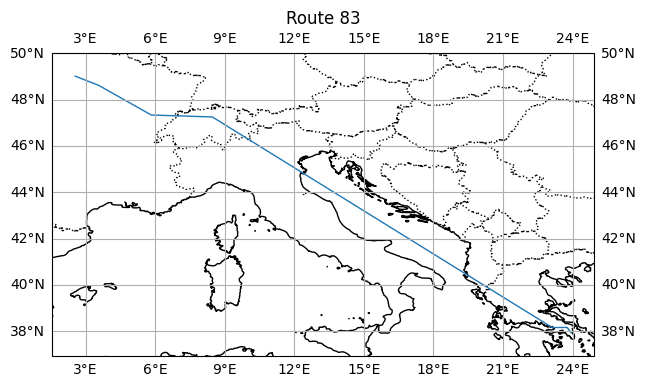

Route 84/100: LGAV -> GERMI -> KRK -> ABADI -> SIROD -> CLM -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,ABADI,234,579,102.562,38.522,-69.485,False,1.0,39.508,16.172,0.057,-0.002,0.012,0.057,-0.066,0.188,-0.016,0.179,0.164
3,ABADI,SIROD,579,114,653.247,83.769,-52.572,False,1.0,547.221,98.621,0.057,-0.002,0.012,0.057,-0.913,1.145,0.004,0.290,0.293
4,SIROD,CLM,114,246,175.665,80.079,-22.197,False,1.0,140.670,24.637,0.057,-0.002,0.012,0.057,-0.235,0.286,0.021,0.109,0.130
5,CLM,LFPG,246,95,20.887,80.070,-3.739,False,1.0,16.724,2.808,0.057,-0.002,0.012,0.057,-0.028,0.033,0.021,0.062,0.083


Totals: bias=0.345, ac_dist=-1.327, time=2.010, preference=0.018, total=1.046


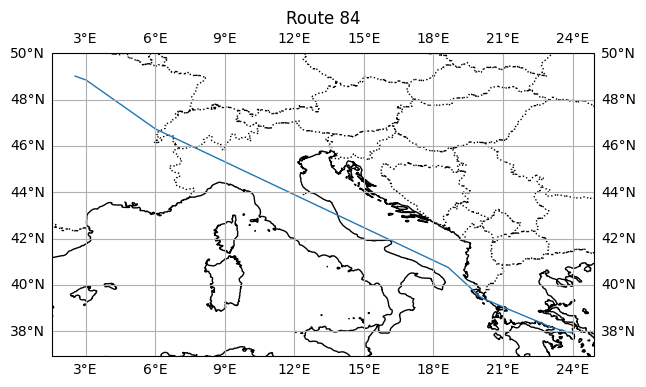

Route 85/100: LGAV -> LGKN -> GERMI -> VADAR -> LFPE -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,VADAR,229,254,884.067,69.430,-52.552,False,1.0,613.805,133.462,0.057,-0.002,0.012,0.057,-1.024,1.549,0.098,0.583,0.681
3,VADAR,LFPE,254,550,208.683,87.068,-22.163,False,1.0,181.696,29.266,0.057,-0.002,0.012,0.057,-0.303,0.340,0.098,0.094,0.192
4,LFPE,LFPG,550,95,12.324,80.070,-0.265,False,1.0,9.868,1.644,0.057,-0.002,0.012,0.057,-0.016,0.019,-0.015,0.060,0.045


Totals: bias=0.287, ac_dist=-1.365, time=1.991, preference=0.133, total=1.046


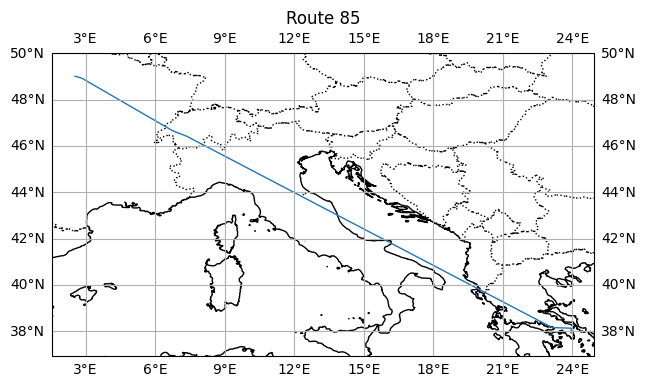

Route 86/100: LGAV -> LGKN -> GERMI -> NIKOL -> LFGX -> LFGJ -> GELTA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,NIKOL,229,580,559.753,43.015,-65.147,False,1.0,240.780,87.268,0.057,-0.002,0.012,0.057,-0.402,1.013,0.001,0.669,0.670
3,NIKOL,LFGX,580,204,364.332,96.526,-51.955,False,1.0,351.676,54.918,0.057,-0.002,0.012,0.057,-0.586,0.637,-0.015,0.108,0.094
4,LFGX,LFGJ,204,259,23.034,80.070,-33.348,False,1.0,18.443,3.317,0.057,-0.002,0.012,0.057,-0.031,0.039,-0.039,0.065,0.026
5,LFGJ,GELTA,259,219,104.660,80.072,-22.805,False,1.0,83.804,14.700,0.057,-0.002,0.012,0.057,-0.140,0.171,-0.039,0.088,0.049
6,GELTA,LFPG,219,95,65.767,80.070,-12.603,False,1.0,52.660,9.022,0.057,-0.002,0.012,0.057,-0.088,0.105,0.005,0.074,0.079


Totals: bias=0.402, ac_dist=-1.268, time=2.047, preference=-0.134, total=1.047


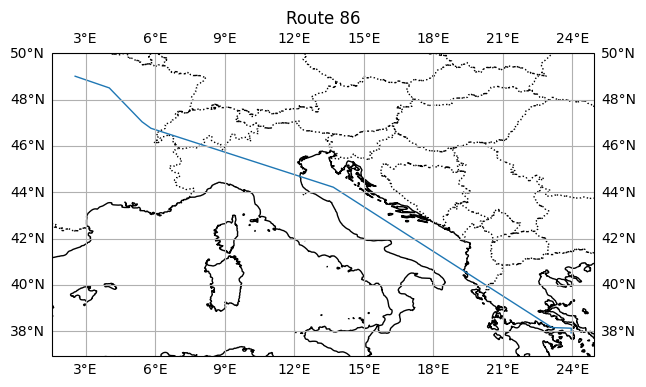

Route 87/100: LGAV -> LGMG -> GERMI_00 -> XANIS -> LGKR -> DAMIC -> BAKEP_11 -> TUROM -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGMG,174,124,27.511,25.460,-8.654,False,1.0,7.004,3.740,0.057,-0.002,0.012,0.057,-0.012,0.043,-0.024,0.089,0.065
1,LGMG,GERMI_00,124,492,15.473,25.460,-42.629,False,1.0,3.939,2.279,0.057,-0.002,0.012,0.057,-0.007,0.026,-0.032,0.077,0.045
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
4,LGKR,DAMIC,270,321,91.184,47.350,-62.613,False,1.0,43.175,14.123,0.057,-0.002,0.012,0.057,-0.072,0.164,-0.015,0.149,0.135
5,DAMIC,BAKEP_11,321,100,341.959,75.063,-54.318,False,1.0,256.684,51.854,0.057,-0.002,0.012,0.057,-0.428,0.602,-0.015,0.231,0.216
6,BAKEP_11,TUROM,100,237,315.063,98.563,-49.953,False,1.0,310.535,47.254,0.057,-0.002,0.012,0.057,-0.518,0.548,-0.015,0.088,0.073
7,TUROM,URELO,237,221,136.130,80.075,-26.410,False,1.0,109.006,19.282,0.057,-0.002,0.012,0.057,-0.182,0.224,0.130,0.099,0.230
8,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.517, ac_dist=-1.365, time=2.008, preference=-0.113, total=1.048


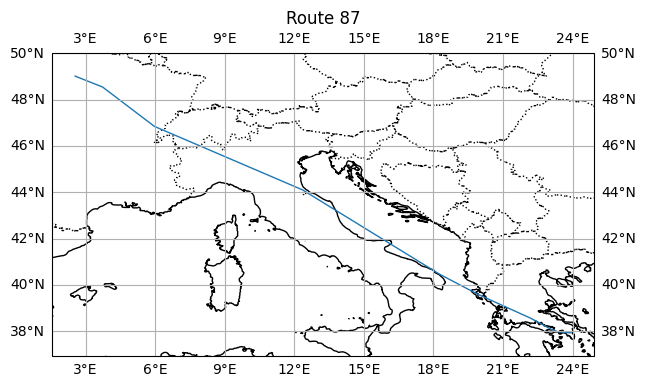

Route 88/100: LGAV -> GERMI -> KRK -> UNKIR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,UNKIR,234,349,766.872,77.393,-52.401,False,1.0,593.503,115.725,0.057,-0.002,0.012,0.057,-0.990,1.343,0.122,0.411,0.533
3,UNKIR,URELO,349,221,131.173,80.074,-24.805,False,1.0,105.036,18.510,0.057,-0.002,0.012,0.057,-0.175,0.215,0.003,0.097,0.100
4,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.287, ac_dist=-1.324, time=2.004, preference=0.085, total=1.052


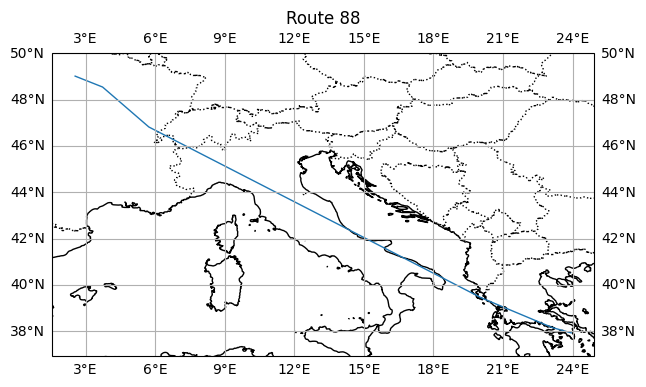

Route 89/100: LGAV -> GERMI -> KRK -> LSTR -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,KRK,229,234,162.091,25.460,-63.085,False,1.0,41.268,25.136,0.057,-0.002,0.012,0.057,-0.069,0.292,-0.001,0.280,0.279
2,KRK,LSTR,234,272,736.105,77.748,-53.360,False,1.0,572.309,111.351,0.057,-0.002,0.012,0.057,-0.954,1.292,0.066,0.396,0.461
3,LSTR,OKIPA,272,232,167.059,84.145,-27.868,False,1.0,140.572,23.745,0.057,-0.002,0.012,0.057,-0.234,0.276,0.052,0.099,0.151
4,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.287, ac_dist=-1.338, time=2.001, preference=0.103, total=1.054


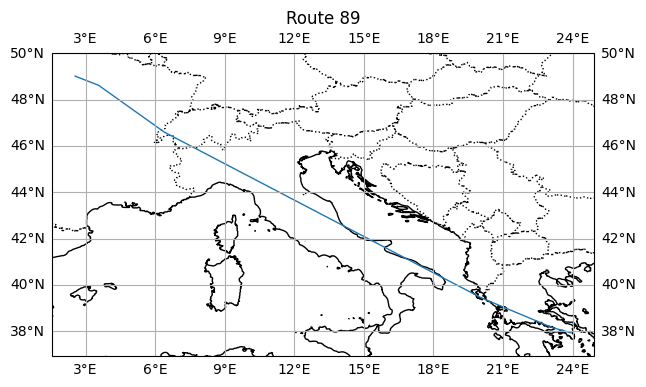

Route 90/100: LGAV -> GERMI_00 -> XANIS -> ENOXA -> AIOSA -> LSTR -> URELO -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI_00,174,492,42.322,25.460,-22.223,False,1.0,10.775,5.936,0.057,-0.002,0.012,0.057,-0.018,0.069,0.160,0.108,0.269
1,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
2,XANIS,ENOXA,319,187,261.131,46.389,-65.726,False,1.0,121.135,40.773,0.057,-0.002,0.012,0.057,-0.202,0.473,-0.018,0.329,0.311
3,ENOXA,AIOSA,187,578,47.559,74.699,-55.640,False,1.0,35.526,7.236,0.057,-0.002,0.012,0.057,-0.059,0.084,-0.018,0.082,0.064
4,AIOSA,LSTR,578,272,543.278,85.873,-54.149,False,1.0,466.527,82.346,0.057,-0.002,0.012,0.057,-0.778,0.956,-0.018,0.235,0.218
5,LSTR,URELO,272,221,159.275,84.336,-28.337,False,1.0,134.326,22.664,0.057,-0.002,0.012,0.057,-0.224,0.263,-0.038,0.097,0.058
6,URELO,LFPG,221,95,54.726,80.070,-11.520,False,1.0,43.819,7.489,0.057,-0.002,0.012,0.057,-0.073,0.087,-0.028,0.071,0.043


Totals: bias=0.402, ac_dist=-1.376, time=2.023, preference=0.005, total=1.054


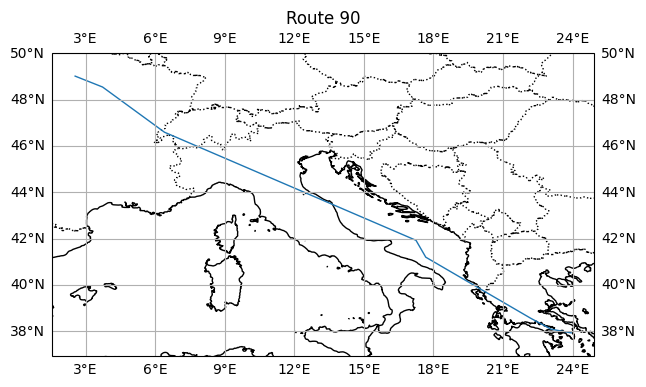

Route 91/100: LGAV -> XORKI -> GERMI -> PIKEL -> LSTR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,XORKI,174,560,24.887,25.460,-24.845,False,1.0,6.336,3.512,0.057,-0.002,0.012,0.057,-0.011,0.041,-0.010,0.088,0.078
1,XORKI,GERMI,560,229,18.162,25.460,-29.059,False,1.0,4.624,2.589,0.057,-0.002,0.012,0.057,-0.008,0.030,0.106,0.080,0.186
2,GERMI,PIKEL,229,5,329.817,41.459,-64.213,False,1.0,136.741,51.295,0.057,-0.002,0.012,0.057,-0.228,0.595,-0.023,0.425,0.402
3,PIKEL,LSTR,5,272,566.690,84.286,-50.471,False,1.0,477.641,85.104,0.057,-0.002,0.012,0.057,-0.797,0.988,-0.023,0.249,0.226
4,LSTR,LFPG,272,95,212.660,83.196,-19.330,False,1.0,176.925,29.627,0.057,-0.002,0.012,0.057,-0.295,0.344,0.057,0.106,0.163


Totals: bias=0.287, ac_dist=-1.338, time=1.998, preference=0.108, total=1.055


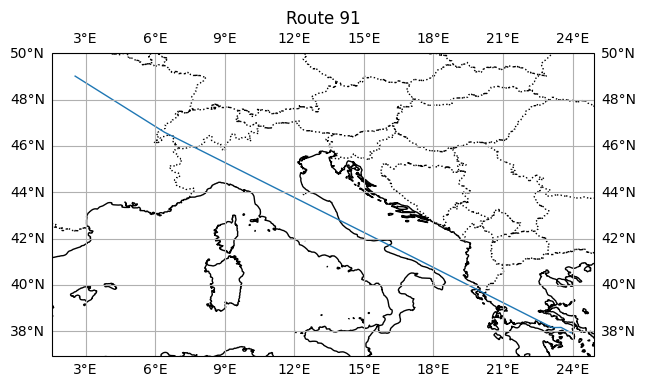

Route 92/100: LGAV -> LGKN -> IXONI -> KRK -> UNKIR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,IXONI,200,148,81.838,25.460,-30.841,False,1.0,20.836,11.715,0.057,-0.002,0.012,0.057,-0.035,0.136,-0.054,0.159,0.105
2,IXONI,KRK,148,234,121.571,25.460,-65.842,False,1.0,30.952,18.988,0.057,-0.002,0.012,0.057,-0.052,0.220,0.048,0.226,0.274
3,KRK,UNKIR,234,349,766.872,77.393,-52.401,False,1.0,593.503,115.725,0.057,-0.002,0.012,0.057,-0.990,1.343,0.122,0.411,0.533
4,UNKIR,LFPG,349,95,183.608,80.079,-17.516,False,1.0,147.031,25.473,0.057,-0.002,0.012,0.057,-0.245,0.296,-0.024,0.108,0.084


Totals: bias=0.287, ac_dist=-1.326, time=2.014, preference=0.080, total=1.055


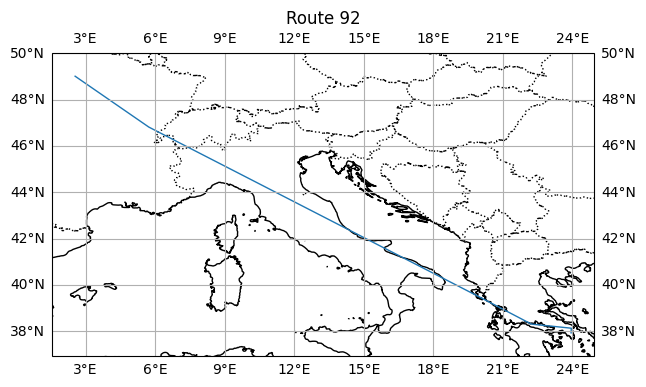

Route 93/100: LGAV -> GERMI -> AIOSA -> LSTR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,AIOSA,229,578,351.957,45.218,-68.744,False,1.0,159.148,55.389,0.057,-0.002,0.012,0.057,-0.265,0.643,0.143,0.435,0.578
2,AIOSA,LSTR,578,272,543.278,85.873,-54.149,False,1.0,466.527,82.346,0.057,-0.002,0.012,0.057,-0.778,0.956,-0.018,0.235,0.218
3,LSTR,LFPG,272,95,212.660,83.196,-19.330,False,1.0,176.925,29.627,0.057,-0.002,0.012,0.057,-0.295,0.344,0.057,0.106,0.163


Totals: bias=0.230, ac_dist=-1.356, time=2.010, preference=0.172, total=1.056


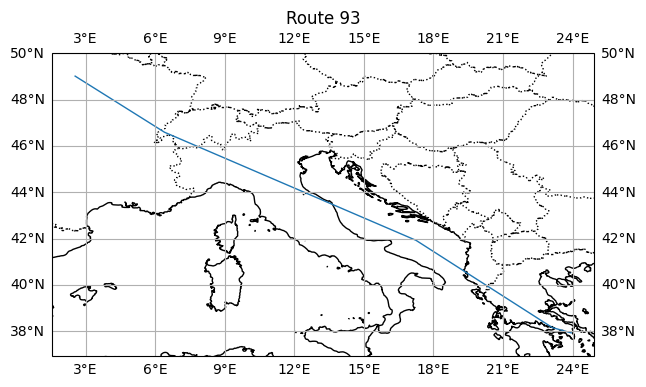

Route 94/100: LGAV -> LGKN -> IXONI -> GOLAS -> UNKIR -> LFET -> LUVAL_68 -> NANOP -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,IXONI,200,148,81.838,25.460,-30.841,False,1.0,20.836,11.715,0.057,-0.002,0.012,0.057,-0.035,0.136,-0.054,0.159,0.105
2,IXONI,GOLAS,148,413,676.182,62.115,-53.960,False,1.0,420.012,102.442,0.057,-0.002,0.012,0.057,-0.700,1.189,-0.027,0.546,0.519
3,GOLAS,UNKIR,413,349,216.203,92.441,-43.075,False,1.0,199.860,31.879,0.057,-0.002,0.012,0.057,-0.333,0.370,-0.027,0.094,0.067
4,UNKIR,LFET,349,556,48.672,80.070,-20.632,False,1.0,38.972,6.801,0.057,-0.002,0.012,0.057,-0.065,0.079,-0.007,0.071,0.064
5,LFET,LUVAL_68,556,571,37.977,80.070,0.000,True,1.0,30.408,5.064,0.057,-0.002,0.012,0.057,-0.051,0.059,0.004,0.066,0.069
6,LUVAL_68,NANOP,571,26,34.487,80.070,0.000,True,1.0,27.614,4.598,0.057,-0.002,0.012,0.057,-0.046,0.053,0.004,0.065,0.068
7,NANOP,LFPG,26,95,80.749,80.070,-13.435,False,1.0,64.656,11.098,0.057,-0.002,0.012,0.057,-0.108,0.129,0.026,0.078,0.105


Totals: bias=0.460, ac_dist=-1.343, time=2.034, preference=-0.094, total=1.056


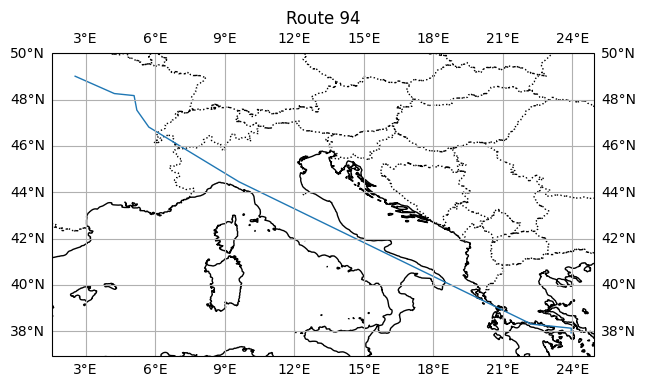

Route 95/100: LGAV -> LGEL -> XANIS -> LGKR -> KONIL -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGEL,174,1,19.906,25.460,-12.911,False,1.0,5.068,2.733,0.057,-0.002,0.012,0.057,-0.008,0.032,0.031,0.081,0.112
1,LGEL,XANIS,1,319,71.394,25.460,-56.069,False,1.0,18.177,10.874,0.057,-0.002,0.012,0.057,-0.030,0.126,0.132,0.153,0.285
2,XANIS,LGKR,319,270,122.669,25.460,-64.595,False,1.0,31.231,19.097,0.057,-0.002,0.012,0.057,-0.052,0.222,-0.078,0.227,0.149
3,LGKR,KONIL,270,238,721.589,78.352,-53.647,False,1.0,565.380,109.234,0.057,-0.002,0.012,0.057,-0.943,1.268,-0.015,0.383,0.368
4,KONIL,OKIPA,238,232,169.638,85.401,-28.157,False,1.0,144.873,24.128,0.057,-0.002,0.012,0.057,-0.242,0.280,-0.015,0.096,0.081
5,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.345, ac_dist=-1.338, time=2.002, preference=0.052, total=1.061


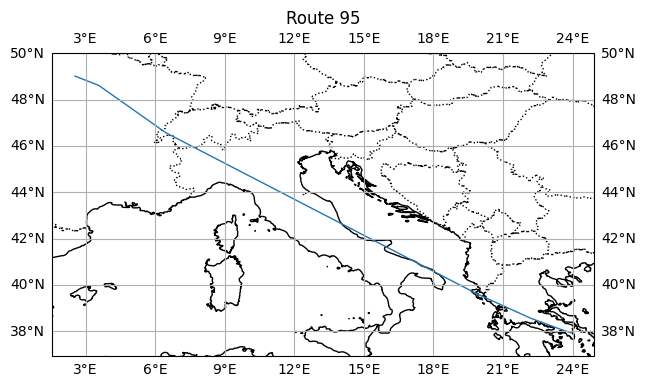

Route 96/100: LGAV -> LUSES_06 -> NURSO -> LIPX -> KONIL -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LUSES_06,174,247,109.563,25.460,0.000,True,1.0,27.895,14.608,0.057,-0.002,0.012,0.057,-0.047,0.170,0.066,0.181,0.247
1,LUSES_06,NURSO,247,493,118.560,29.147,-73.375,False,1.0,34.556,18.888,0.057,-0.002,0.012,0.057,-0.058,0.219,0.313,0.219,0.533
2,NURSO,LIPX,493,507,509.410,52.988,-60.531,False,1.0,269.925,78.478,0.057,-0.002,0.012,0.057,-0.450,0.911,-0.366,0.518,0.152
3,LIPX,KONIL,507,238,197.709,112.556,-53.205,False,1.0,222.534,29.896,0.057,-0.002,0.012,0.057,-0.371,0.347,-0.049,0.033,-0.015
4,KONIL,OKIPA,238,232,169.638,85.401,-28.157,False,1.0,144.873,24.128,0.057,-0.002,0.012,0.057,-0.242,0.280,-0.015,0.096,0.081
5,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.345, ac_dist=-1.229, time=2.001, preference=-0.054, total=1.062


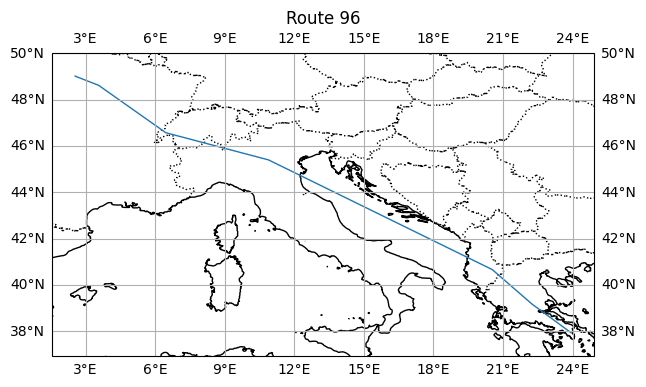

Route 97/100: LGAV -> GERMI -> DISUN -> KUNOD -> RANUX -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,DISUN,229,302,783.923,46.291,-60.820,False,1.0,362.887,120.858,0.057,-0.002,0.012,0.057,-0.605,1.403,-0.031,0.855,0.824
2,DISUN,KUNOD,302,534,66.100,100.020,-50.229,False,1.0,66.113,9.921,0.057,-0.002,0.012,0.057,-0.110,0.115,-0.031,0.062,0.031
3,KUNOD,RANUX,534,457,213.579,86.932,-42.924,False,1.0,185.669,31.480,0.057,-0.002,0.012,0.057,-0.310,0.365,-0.031,0.113,0.082
4,RANUX,LFPG,457,95,71.755,80.070,-11.019,False,1.0,57.454,9.808,0.057,-0.002,0.012,0.057,-0.096,0.114,-0.031,0.075,0.044


Totals: bias=0.287, ac_dist=-1.138, time=2.064, preference=-0.136, total=1.078


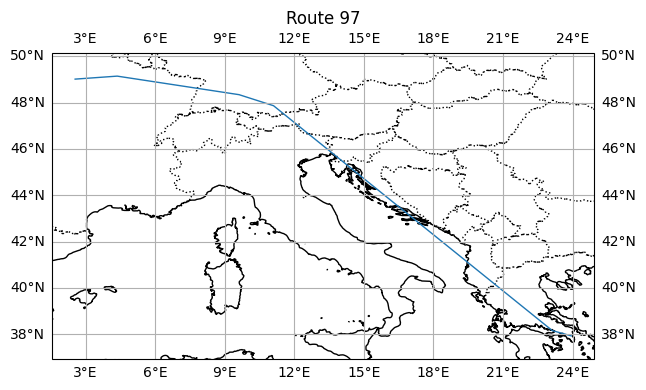

Route 98/100: LGAV -> LGMG -> GERMI_00 -> XANIS -> RONAG -> MOROK -> JAVVU -> OKIPA -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGMG,174,124,27.511,25.460,-8.654,False,1.0,7.004,3.740,0.057,-0.002,0.012,0.057,-0.012,0.043,-0.024,0.089,0.065
1,LGMG,GERMI_00,124,492,15.473,25.460,-42.629,False,1.0,3.939,2.279,0.057,-0.002,0.012,0.057,-0.007,0.026,-0.032,0.077,0.045
2,GERMI_00,XANIS,492,319,50.634,25.460,-63.656,False,1.0,12.892,7.864,0.057,-0.002,0.012,0.057,-0.021,0.091,-0.036,0.127,0.091
3,XANIS,RONAG,319,439,719.614,52.827,-54.684,False,1.0,380.150,109.221,0.057,-0.002,0.012,0.057,-0.634,1.268,0.050,0.691,0.741
4,RONAG,MOROK,439,384,151.885,158.687,-46.753,False,1.0,241.021,22.599,0.057,-0.002,0.012,0.057,-0.402,0.262,-0.011,-0.082,-0.093
5,MOROK,JAVVU,384,397,33.702,80.070,-38.552,False,1.0,26.985,4.915,0.057,-0.002,0.012,0.057,-0.045,0.057,-0.011,0.070,0.059
6,JAVVU,OKIPA,397,232,119.213,80.074,-27.145,False,1.0,95.459,16.915,0.057,-0.002,0.012,0.057,-0.159,0.196,0.011,0.095,0.106
7,OKIPA,LFPG,232,95,46.745,80.070,-10.627,False,1.0,37.429,6.383,0.057,-0.002,0.012,0.057,-0.062,0.074,-0.004,0.069,0.065


Totals: bias=0.460, ac_dist=-1.342, time=2.019, preference=-0.057, total=1.079


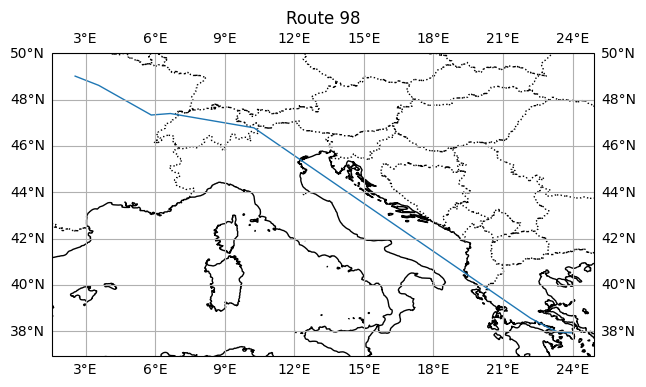

Route 99/100: LGAV -> LGKN -> GERMI -> AIOSA -> LSTR -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,LGKN,174,200,12.129,25.460,-3.611,False,1.0,3.088,1.630,0.057,-0.002,0.012,0.057,-0.005,0.019,-0.012,0.071,0.059
1,LGKN,GERMI,200,229,39.143,25.460,-23.499,False,1.0,9.966,5.507,0.057,-0.002,0.012,0.057,-0.017,0.064,-0.035,0.105,0.069
2,GERMI,AIOSA,229,578,351.957,45.218,-68.744,False,1.0,159.148,55.389,0.057,-0.002,0.012,0.057,-0.265,0.643,0.143,0.435,0.578
3,AIOSA,LSTR,578,272,543.278,85.873,-54.149,False,1.0,466.527,82.346,0.057,-0.002,0.012,0.057,-0.778,0.956,-0.018,0.235,0.218
4,LSTR,LFPG,272,95,212.660,83.196,-19.330,False,1.0,176.925,29.627,0.057,-0.002,0.012,0.057,-0.295,0.344,0.057,0.106,0.163


Totals: bias=0.287, ac_dist=-1.360, time=2.025, preference=0.135, total=1.087


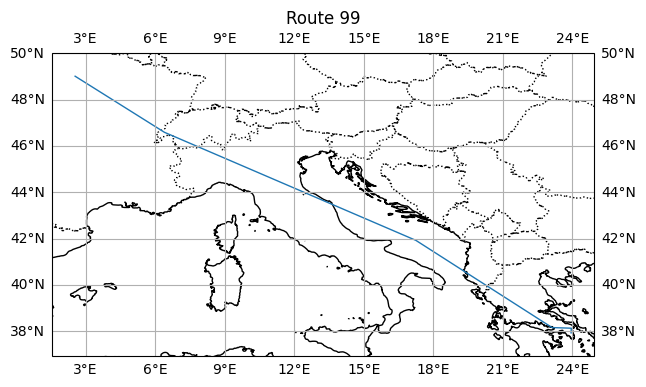

Route 100/100: LGAV -> GERMI -> IXONI -> SIROD -> CLM -> LFPG


,u_node,v_node,u_idx,v_idx,distance,airspace_charge,tailwind_kts,tailwind_is_fallback,feature_bias,feature_ac_dist,feature_time,weight_bias,weight_ac_dist,weight_time,cost_bias,cost_ac_dist,cost_time,cost_preference,cost_common,cost_total
0,LGAV,GERMI,174,229,41.135,25.460,-24.097,False,1.0,10.473,5.795,0.057,-0.002,0.012,0.057,-0.017,0.067,-0.010,0.107,0.097
1,GERMI,IXONI,229,148,43.021,25.460,-47.639,False,1.0,10.953,6.415,0.057,-0.002,0.012,0.057,-0.018,0.074,0.097,0.114,0.210
2,IXONI,SIROD,148,114,874.626,70.655,-50.723,False,1.0,617.967,131.431,0.057,-0.002,0.012,0.057,-1.031,1.526,0.017,0.552,0.569
3,SIROD,CLM,114,246,175.665,80.079,-22.197,False,1.0,140.670,24.637,0.057,-0.002,0.012,0.057,-0.235,0.286,0.021,0.109,0.130
4,CLM,LFPG,246,95,20.887,80.070,-3.739,False,1.0,16.724,2.808,0.057,-0.002,0.012,0.057,-0.028,0.033,0.021,0.062,0.083


Totals: bias=0.287, ac_dist=-1.329, time=1.986, preference=0.145, total=1.089


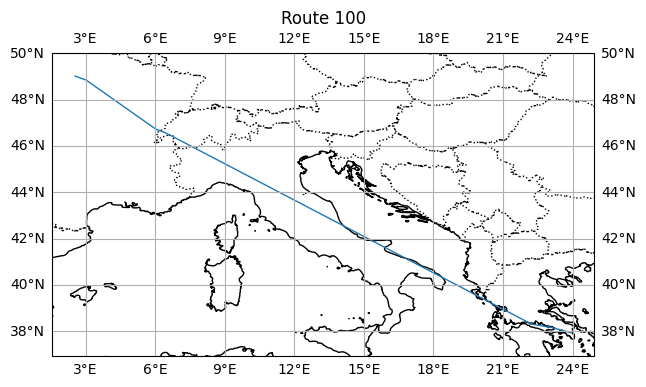

[{'route_nodes': ['LGAV', 'GERMI', 'DJL', 'OKIPA', 'LFPG'],
  'breakdown': [{'u_node': 'LGAV',
    'v_node': 'GERMI',
    'u_idx': 174,
    'v_idx': 229,
    'distance': 41.13454431417115,
    'airspace_charge': 25.46,
    'tailwind_kts': -24.0974178314209,
    'tailwind_is_fallback': False,
    'feature_bias': 1.0,
    'feature_ac_dist': 10.472854982387975,
    'feature_time': 5.7949229757742255,
    'weight_bias': 0.057470791041851044,
    'weight_ac_dist': -0.0016676867380738258,
    'weight_time': 0.011607230640947819,
    'cost_bias': 0.057470791041851044,
    'cost_ac_dist': -0.017465441363898816,
    'cost_time': 0.06726300752633911,
    'cost_preference': -0.010032030753791332,
    'cost_common': 0.10726835720429134,
    'cost_total': 0.09723632645050001},
   {'u_node': 'GERMI',
    'v_node': 'DJL',
    'u_idx': 229,
    'v_idx': 330,
    'distance': 961.2836156282639,
    'airspace_charge': 70.68506600653683,
    'tailwind_kts': -48.504398345947266,
    'tailwind_is_fallback':

In [11]:
from equinox.posttrain.cost_back_envelope import compute_routes_cost_breakdowns


compute_routes_cost_breakdowns(
    checkpoint_path=latest_checkpoint_filename,
    case_dir=case_dir,
    flight_id="46B825AEE612",
    takeoff_time="1682767235",
    routes_path=Path(f"data/cases/LGAV_LFPG/inference_flight_{reference_flight_id}/routes.txt"),
    limit=100
)